# Set Up
- Download the ECG dataset hosted on kaggle. **This step requires a Kaggle API token.**
- Clone the project repository to access the experiment models

In [1]:
!pip install -q kaggle
!pip install lime
!pip install torchviz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 6.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=edc312f65b31b4f0d52d3fc5fafe40ec427fb099a189ae8bfac29e16fe69adfa
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime
  Preparing metadata (setup.py) ... done
  Created wheel for torchviz: filename=torchviz-0.0.2-py3-none-any.whl size=4131 sha256=b895d66c2d17bafb5c7ccedf3ac42077d48f62aad36079c20516e54cfff157ba
  Stored in directory: /root/.cache/pip/wheels/4c/97/88/a02973217949e0db0c9f4346d154085f4725f99c4f15a87094
Successfully built torchviz


In [2]:
from google.colab import files

uploaded = files.upload()

# make sure there is a kaggle.json file
!ls -lha kaggle.json

# install the Kaggle API token
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
-rw-r--r-- 1 root root 67 Dec  2 09:01 kaggle.json


In [3]:
# download and unzip the ECG dataset hosted on kaggle
!kaggle datasets download -d shayanfazeli/heartbeat
!unzip -q heartbeat.zip

# clone the project github repository
!git clone https://github.com/distributedgarden/tsc_attention.git

 83% 82.0M/98.8M [00:00<00:00, 312MB/s]
100% 98.8M/98.8M [00:00<00:00, 299MB/s]
Cloning into 'tsc_attention'...
remote: Enumerating objects: 265, done.
remote: Counting objects: 100% (62/62), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 265 (delta 30), reused 41 (delta 13), pack-reused 203
Receiving objects: 100% (265/265), 4.39 MiB | 16.79 MiB/s, done.
Resolving deltas: 100% (141/141), done.


# LSTM Experiment
### Description:
Use the ECG dataset to train the basic LSTM model and evaluate its performance.


### Steps:
1. split the ECG data into train and test subsets
1. preprocess the subsets (standard scaling)
1. convert to pytorch tensors
1. set up the LSTM model
1. train the LSTM model
1. evaluate performance with accuracy, F1 score, precision, recall

In [4]:
import logging
import lime
import lime.lime_tabular
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc
from torch.autograd import Variable
from torch.utils.data import DataLoader, TensorDataset
from torchviz import make_dot
from IPython.core.display import HTML
from itertools import cycle
from functools import partial


%cd tsc_attention
from src.models.lstm_fcn import LSTMFCN
from src.models.attention_lstm_fcn import AttentionLSTMFCN
from src.utils import (
    evaluate,
    plot_metrics,
    plot_incorrect_predictions,
    visualize_model_graph,
    sample,
    batch_predict,
    explain_instance,
    roc_plot,
    generate_saliency_map,
    saliency_maps,
    overlay_saliency_maps,
)
%cd ..

/content/tsc_attention
/content


In [5]:
logging.root.handlers = []

logging.basicConfig(
    level=logging.INFO,
    format="%(asctime)s - %(name)s - %(levelname)s - %(message)s"
)

logging.info("Test")

2023-12-02 09:01:50,259 - root - INFO - Test


In [6]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [7]:
# load data
train_df = pd.read_csv("mitbih_train.csv", header=None)
test_df = pd.read_csv("mitbih_test.csv", header=None)

#train_df = train_df.sample(frac=0.01)

# last column is the label
X_train = train_df.iloc[:, :-1].values
y_train = train_df.iloc[:, -1].values
X_test = test_df.iloc[:, :-1].values
y_test = test_df.iloc[:, -1].values

print(len(train_df))
print(len(test_df))
print(len(X_train[1]))
print(X_train[1])

87554
21892
187
[0.96011394 0.86324787 0.46153846 0.1965812  0.0940171  0.12535612
 0.0997151  0.08831909 0.07407407 0.08262108 0.07407407 0.06267806
 0.06552707 0.06552707 0.06267806 0.07692308 0.07122507 0.08262108
 0.09116809 0.09686609 0.08262108 0.08262108 0.09116809 0.10541311
 0.12250713 0.14814815 0.18233618 0.19373219 0.21367522 0.20797721
 0.22222222 0.25356126 0.27065527 0.28774929 0.28490028 0.29344729
 0.25641027 0.24786325 0.18803419 0.14529915 0.10826211 0.08262108
 0.07977208 0.07407407 0.01424501 0.01139601 0.06267806 0.05128205
 0.05698006 0.04843305 0.02849003 0.03133903 0.07692308 0.02564103
 0.02849003 0.03703704 0.0940171  0.08547009 0.03988604 0.05982906
 0.07407407 0.07977208 0.09116809 0.0997151  0.10826211 0.08831909
 0.09116809 0.06552707 0.08547009 0.08831909 0.07692308 0.08262108
 0.09686609 0.0997151  0.13390313 0.1025641  0.03988604 0.06552707
 0.07407407 0.08262108 0.08547009 0.05698006 0.04558405 0.1025641
 0.03988604 0.01139601 0.01709402 0.03133903 0.

In [8]:
# normalize the ECG signals
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# convert to tensors
X_train_tensor = torch.tensor(X_train).float().unsqueeze(2)  # Adding channel dimension
y_train_tensor = torch.tensor(y_train).long()
X_test_tensor = torch.tensor(X_test).float().unsqueeze(2)  # Adding channel dimension
y_test_tensor = torch.tensor(y_test).long()

# Dataset objects
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

# DataLoaders
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)


In [9]:
# set parameters
# ECG data is univariate, so the input dimension is 1
input_dim = 1
hidden_dim = 128
num_layers = 2
num_classes = 5

model = LSTMFCN(input_dim, num_classes, hidden_size=hidden_dim, num_layers=num_layers)
model.to(device)

# loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

print(model)

LSTMFCN(
  (lstm): LSTM(1, 128, num_layers=2, batch_first=True)
  (dropout): Dropout(p=0.8, inplace=False)
  (conv1): Conv1d(1, 128, kernel_size=(8,), stride=(1,), padding=same)
  (bn1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv1d(128, 256, kernel_size=(5,), stride=(1,), padding=same)
  (bn2): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv1d(256, 128, kernel_size=(3,), stride=(1,), padding=same)
  (bn3): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (global_avg_pooling): AdaptiveAvgPool1d(output_size=1)
  (fc): Linear(in_features=256, out_features=5, bias=True)
)


In [10]:
# store metrics for display
accuracies = []
precisions = []
recalls = []
f1_scores = []
losses = []
incorrect_indexes = []

# train
num_epochs = 10
for epoch in range(num_epochs):
    model.train()
    total_loss = 0
    for i, (inputs, labels) in enumerate(train_loader):
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

        if (i+1) % 100 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(train_loader)}], Loss: {loss.item():.4f}")

    # average loss for this epoch
    epoch_loss = total_loss / len(train_loader)
    losses.append(epoch_loss)

    # store metrics
    accuracy, precision, recall, f1, epoch_incorrect_indexes, _ = evaluate(model, test_loader)
    accuracies.append(accuracy)
    precisions.append(precision)
    recalls.append(recall)
    f1_scores.append(f1)
    incorrect_indexes.append(epoch_incorrect_indexes)


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:306: UserWarning: Using padding='same' with even kernel lengths and odd dilation may require a zero-padded copy of the input be created (Triggered internally at ../aten/src/ATen/native/Convolution.cpp:1008.)
  return F.conv1d(input, weight, bias, self.stride,


Epoch [1/10], Step [100/2737], Loss: 0.6957
Epoch [1/10], Step [200/2737], Loss: 0.4737
Epoch [1/10], Step [300/2737], Loss: 0.2258
Epoch [1/10], Step [400/2737], Loss: 0.3350
Epoch [1/10], Step [500/2737], Loss: 0.3208
Epoch [1/10], Step [600/2737], Loss: 0.5366
Epoch [1/10], Step [700/2737], Loss: 0.2994
Epoch [1/10], Step [800/2737], Loss: 0.1700
Epoch [1/10], Step [900/2737], Loss: 0.3032
Epoch [1/10], Step [1000/2737], Loss: 0.4824
Epoch [1/10], Step [1100/2737], Loss: 0.2956
Epoch [1/10], Step [1200/2737], Loss: 0.2393
Epoch [1/10], Step [1300/2737], Loss: 0.0558
Epoch [1/10], Step [1400/2737], Loss: 0.2333
Epoch [1/10], Step [1500/2737], Loss: 0.2853
Epoch [1/10], Step [1600/2737], Loss: 0.4005
Epoch [1/10], Step [1700/2737], Loss: 0.2009
Epoch [1/10], Step [1800/2737], Loss: 0.1795
Epoch [1/10], Step [1900/2737], Loss: 0.2731
Epoch [1/10], Step [2000/2737], Loss: 0.4079
Epoch [1/10], Step [2100/2737], Loss: 0.1966
Epoch [1/10], Step [2200/2737], Loss: 0.0991
Epoch [1/10], Step 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
2023-12-02 09:02:31,993 - root - INFO - Accuracy: 95.31%
2023-12-02 09:02:31,994 - root - INFO - Precision: 0.9443
2023-12-02 09:02:31,995 - root - INFO - Recall: 0.9531
2023-12-02 09:02:31,996 - root - INFO - F1 Score: 0.9465


Epoch [2/10], Step [100/2737], Loss: 0.1433
Epoch [2/10], Step [200/2737], Loss: 0.2454
Epoch [2/10], Step [300/2737], Loss: 0.1374
Epoch [2/10], Step [400/2737], Loss: 0.0928
Epoch [2/10], Step [500/2737], Loss: 0.0557
Epoch [2/10], Step [600/2737], Loss: 0.0908
Epoch [2/10], Step [700/2737], Loss: 0.1279
Epoch [2/10], Step [800/2737], Loss: 0.1328
Epoch [2/10], Step [900/2737], Loss: 0.0428
Epoch [2/10], Step [1000/2737], Loss: 0.0781
Epoch [2/10], Step [1100/2737], Loss: 0.1232
Epoch [2/10], Step [1200/2737], Loss: 0.2277
Epoch [2/10], Step [1300/2737], Loss: 0.2359
Epoch [2/10], Step [1400/2737], Loss: 0.0599
Epoch [2/10], Step [1500/2737], Loss: 0.0885
Epoch [2/10], Step [1600/2737], Loss: 0.0440
Epoch [2/10], Step [1700/2737], Loss: 0.0415
Epoch [2/10], Step [1800/2737], Loss: 0.1015
Epoch [2/10], Step [1900/2737], Loss: 0.0927
Epoch [2/10], Step [2000/2737], Loss: 0.1404
Epoch [2/10], Step [2100/2737], Loss: 0.0589
Epoch [2/10], Step [2200/2737], Loss: 0.0144
Epoch [2/10], Step 

2023-12-02 09:02:50,383 - root - INFO - Accuracy: 95.15%
2023-12-02 09:02:50,384 - root - INFO - Precision: 0.9527
2023-12-02 09:02:50,385 - root - INFO - Recall: 0.9515
2023-12-02 09:02:50,386 - root - INFO - F1 Score: 0.9505


Epoch [3/10], Step [100/2737], Loss: 0.0878
Epoch [3/10], Step [200/2737], Loss: 0.0341
Epoch [3/10], Step [300/2737], Loss: 0.0708
Epoch [3/10], Step [400/2737], Loss: 0.1792
Epoch [3/10], Step [500/2737], Loss: 0.2548
Epoch [3/10], Step [600/2737], Loss: 0.0406
Epoch [3/10], Step [700/2737], Loss: 0.0334
Epoch [3/10], Step [800/2737], Loss: 0.0614
Epoch [3/10], Step [900/2737], Loss: 0.1627
Epoch [3/10], Step [1000/2737], Loss: 0.1736
Epoch [3/10], Step [1100/2737], Loss: 0.1170
Epoch [3/10], Step [1200/2737], Loss: 0.1614
Epoch [3/10], Step [1300/2737], Loss: 0.3987
Epoch [3/10], Step [1400/2737], Loss: 0.2201
Epoch [3/10], Step [1500/2737], Loss: 0.2031
Epoch [3/10], Step [1600/2737], Loss: 0.1378
Epoch [3/10], Step [1700/2737], Loss: 0.1066
Epoch [3/10], Step [1800/2737], Loss: 0.1344
Epoch [3/10], Step [1900/2737], Loss: 0.0502
Epoch [3/10], Step [2000/2737], Loss: 0.0755
Epoch [3/10], Step [2100/2737], Loss: 0.0208
Epoch [3/10], Step [2200/2737], Loss: 0.1909
Epoch [3/10], Step 

2023-12-02 09:03:08,830 - root - INFO - Accuracy: 95.90%
2023-12-02 09:03:08,831 - root - INFO - Precision: 0.9576
2023-12-02 09:03:08,832 - root - INFO - Recall: 0.9590
2023-12-02 09:03:08,833 - root - INFO - F1 Score: 0.9557


Epoch [4/10], Step [100/2737], Loss: 0.0474
Epoch [4/10], Step [200/2737], Loss: 0.0806
Epoch [4/10], Step [300/2737], Loss: 0.0724
Epoch [4/10], Step [400/2737], Loss: 0.1472
Epoch [4/10], Step [500/2737], Loss: 0.2193
Epoch [4/10], Step [600/2737], Loss: 0.1623
Epoch [4/10], Step [700/2737], Loss: 0.2194
Epoch [4/10], Step [800/2737], Loss: 0.0646
Epoch [4/10], Step [900/2737], Loss: 0.0273
Epoch [4/10], Step [1000/2737], Loss: 0.0209
Epoch [4/10], Step [1100/2737], Loss: 0.1947
Epoch [4/10], Step [1200/2737], Loss: 0.0188
Epoch [4/10], Step [1300/2737], Loss: 0.2461
Epoch [4/10], Step [1400/2737], Loss: 0.0133
Epoch [4/10], Step [1500/2737], Loss: 0.0201
Epoch [4/10], Step [1600/2737], Loss: 0.1036
Epoch [4/10], Step [1700/2737], Loss: 0.0205
Epoch [4/10], Step [1800/2737], Loss: 0.0731
Epoch [4/10], Step [1900/2737], Loss: 0.1094
Epoch [4/10], Step [2000/2737], Loss: 0.0516
Epoch [4/10], Step [2100/2737], Loss: 0.0124
Epoch [4/10], Step [2200/2737], Loss: 0.1293
Epoch [4/10], Step 

2023-12-02 09:03:27,293 - root - INFO - Accuracy: 97.10%
2023-12-02 09:03:27,294 - root - INFO - Precision: 0.9713
2023-12-02 09:03:27,295 - root - INFO - Recall: 0.9710
2023-12-02 09:03:27,296 - root - INFO - F1 Score: 0.9697


Epoch [5/10], Step [100/2737], Loss: 0.3192
Epoch [5/10], Step [200/2737], Loss: 0.0359
Epoch [5/10], Step [300/2737], Loss: 0.0731
Epoch [5/10], Step [400/2737], Loss: 0.0866
Epoch [5/10], Step [500/2737], Loss: 0.1867
Epoch [5/10], Step [600/2737], Loss: 0.4490
Epoch [5/10], Step [700/2737], Loss: 0.3732
Epoch [5/10], Step [800/2737], Loss: 0.0690
Epoch [5/10], Step [900/2737], Loss: 0.0375
Epoch [5/10], Step [1000/2737], Loss: 0.0185
Epoch [5/10], Step [1100/2737], Loss: 0.1021
Epoch [5/10], Step [1200/2737], Loss: 0.1503
Epoch [5/10], Step [1300/2737], Loss: 0.1392
Epoch [5/10], Step [1400/2737], Loss: 0.1225
Epoch [5/10], Step [1500/2737], Loss: 0.3234
Epoch [5/10], Step [1600/2737], Loss: 0.3242
Epoch [5/10], Step [1700/2737], Loss: 0.0322
Epoch [5/10], Step [1800/2737], Loss: 0.0868
Epoch [5/10], Step [1900/2737], Loss: 0.0937
Epoch [5/10], Step [2000/2737], Loss: 0.0344
Epoch [5/10], Step [2100/2737], Loss: 0.0353
Epoch [5/10], Step [2200/2737], Loss: 0.0659
Epoch [5/10], Step 

2023-12-02 09:03:45,773 - root - INFO - Accuracy: 96.86%
2023-12-02 09:03:45,774 - root - INFO - Precision: 0.9685
2023-12-02 09:03:45,775 - root - INFO - Recall: 0.9686
2023-12-02 09:03:45,776 - root - INFO - F1 Score: 0.9659


Epoch [6/10], Step [100/2737], Loss: 0.0543
Epoch [6/10], Step [200/2737], Loss: 0.2401
Epoch [6/10], Step [300/2737], Loss: 0.0321
Epoch [6/10], Step [400/2737], Loss: 0.0912
Epoch [6/10], Step [500/2737], Loss: 0.0482
Epoch [6/10], Step [600/2737], Loss: 0.0218
Epoch [6/10], Step [700/2737], Loss: 0.1635
Epoch [6/10], Step [800/2737], Loss: 0.1410
Epoch [6/10], Step [900/2737], Loss: 0.0395
Epoch [6/10], Step [1000/2737], Loss: 0.0236
Epoch [6/10], Step [1100/2737], Loss: 0.0220
Epoch [6/10], Step [1200/2737], Loss: 0.0446
Epoch [6/10], Step [1300/2737], Loss: 0.2235
Epoch [6/10], Step [1400/2737], Loss: 0.0879
Epoch [6/10], Step [1500/2737], Loss: 0.2064
Epoch [6/10], Step [1600/2737], Loss: 0.0537
Epoch [6/10], Step [1700/2737], Loss: 0.0289
Epoch [6/10], Step [1800/2737], Loss: 0.0492
Epoch [6/10], Step [1900/2737], Loss: 0.0150
Epoch [6/10], Step [2000/2737], Loss: 0.0609
Epoch [6/10], Step [2100/2737], Loss: 0.0293
Epoch [6/10], Step [2200/2737], Loss: 0.1242
Epoch [6/10], Step 

2023-12-02 09:04:04,279 - root - INFO - Accuracy: 96.82%
2023-12-02 09:04:04,280 - root - INFO - Precision: 0.9667
2023-12-02 09:04:04,281 - root - INFO - Recall: 0.9682
2023-12-02 09:04:04,282 - root - INFO - F1 Score: 0.9661


Epoch [7/10], Step [100/2737], Loss: 0.1658
Epoch [7/10], Step [200/2737], Loss: 0.0128
Epoch [7/10], Step [300/2737], Loss: 0.2104
Epoch [7/10], Step [400/2737], Loss: 0.0279
Epoch [7/10], Step [500/2737], Loss: 0.1235
Epoch [7/10], Step [600/2737], Loss: 0.0068
Epoch [7/10], Step [700/2737], Loss: 0.0759
Epoch [7/10], Step [800/2737], Loss: 0.0362
Epoch [7/10], Step [900/2737], Loss: 0.0325
Epoch [7/10], Step [1000/2737], Loss: 0.0229
Epoch [7/10], Step [1100/2737], Loss: 0.0342
Epoch [7/10], Step [1200/2737], Loss: 0.0690
Epoch [7/10], Step [1300/2737], Loss: 0.0199
Epoch [7/10], Step [1400/2737], Loss: 0.0527
Epoch [7/10], Step [1500/2737], Loss: 0.0455
Epoch [7/10], Step [1600/2737], Loss: 0.0422
Epoch [7/10], Step [1700/2737], Loss: 0.0544
Epoch [7/10], Step [1800/2737], Loss: 0.0108
Epoch [7/10], Step [1900/2737], Loss: 0.0486
Epoch [7/10], Step [2000/2737], Loss: 0.1960
Epoch [7/10], Step [2100/2737], Loss: 0.1308
Epoch [7/10], Step [2200/2737], Loss: 0.0530
Epoch [7/10], Step 

2023-12-02 09:04:22,715 - root - INFO - Accuracy: 97.19%
2023-12-02 09:04:22,717 - root - INFO - Precision: 0.9711
2023-12-02 09:04:22,717 - root - INFO - Recall: 0.9719
2023-12-02 09:04:22,718 - root - INFO - F1 Score: 0.9697


Epoch [8/10], Step [100/2737], Loss: 0.0319
Epoch [8/10], Step [200/2737], Loss: 0.0926
Epoch [8/10], Step [300/2737], Loss: 0.0159
Epoch [8/10], Step [400/2737], Loss: 0.1918
Epoch [8/10], Step [500/2737], Loss: 0.0316
Epoch [8/10], Step [600/2737], Loss: 0.0241
Epoch [8/10], Step [700/2737], Loss: 0.0322
Epoch [8/10], Step [800/2737], Loss: 0.0324
Epoch [8/10], Step [900/2737], Loss: 0.0169
Epoch [8/10], Step [1000/2737], Loss: 0.0199
Epoch [8/10], Step [1100/2737], Loss: 0.0193
Epoch [8/10], Step [1200/2737], Loss: 0.1198
Epoch [8/10], Step [1300/2737], Loss: 0.1793
Epoch [8/10], Step [1400/2737], Loss: 0.2285
Epoch [8/10], Step [1500/2737], Loss: 0.0142
Epoch [8/10], Step [1600/2737], Loss: 0.1774
Epoch [8/10], Step [1700/2737], Loss: 0.0302
Epoch [8/10], Step [1800/2737], Loss: 0.0444
Epoch [8/10], Step [1900/2737], Loss: 0.0394
Epoch [8/10], Step [2000/2737], Loss: 0.2070
Epoch [8/10], Step [2100/2737], Loss: 0.2082
Epoch [8/10], Step [2200/2737], Loss: 0.0076
Epoch [8/10], Step 

2023-12-02 09:04:41,143 - root - INFO - Accuracy: 97.24%
2023-12-02 09:04:41,144 - root - INFO - Precision: 0.9721
2023-12-02 09:04:41,145 - root - INFO - Recall: 0.9724
2023-12-02 09:04:41,146 - root - INFO - F1 Score: 0.9713


Epoch [9/10], Step [100/2737], Loss: 0.0937
Epoch [9/10], Step [200/2737], Loss: 0.0100
Epoch [9/10], Step [300/2737], Loss: 0.0604
Epoch [9/10], Step [400/2737], Loss: 0.2911
Epoch [9/10], Step [500/2737], Loss: 0.0117
Epoch [9/10], Step [600/2737], Loss: 0.0148
Epoch [9/10], Step [700/2737], Loss: 0.1295
Epoch [9/10], Step [800/2737], Loss: 0.0809
Epoch [9/10], Step [900/2737], Loss: 0.1463
Epoch [9/10], Step [1000/2737], Loss: 0.0402
Epoch [9/10], Step [1100/2737], Loss: 0.0573
Epoch [9/10], Step [1200/2737], Loss: 0.0383
Epoch [9/10], Step [1300/2737], Loss: 0.0179
Epoch [9/10], Step [1400/2737], Loss: 0.1626
Epoch [9/10], Step [1500/2737], Loss: 0.0783
Epoch [9/10], Step [1600/2737], Loss: 0.0957
Epoch [9/10], Step [1700/2737], Loss: 0.2127
Epoch [9/10], Step [1800/2737], Loss: 0.0404
Epoch [9/10], Step [1900/2737], Loss: 0.1118
Epoch [9/10], Step [2000/2737], Loss: 0.0056
Epoch [9/10], Step [2100/2737], Loss: 0.0164
Epoch [9/10], Step [2200/2737], Loss: 0.0356
Epoch [9/10], Step 

2023-12-02 09:04:59,697 - root - INFO - Accuracy: 97.71%
2023-12-02 09:04:59,698 - root - INFO - Precision: 0.9763
2023-12-02 09:04:59,699 - root - INFO - Recall: 0.9771
2023-12-02 09:04:59,700 - root - INFO - F1 Score: 0.9761


Epoch [10/10], Step [100/2737], Loss: 0.0200
Epoch [10/10], Step [200/2737], Loss: 0.3586
Epoch [10/10], Step [300/2737], Loss: 0.0461
Epoch [10/10], Step [400/2737], Loss: 0.0384
Epoch [10/10], Step [500/2737], Loss: 0.0353
Epoch [10/10], Step [600/2737], Loss: 0.1491
Epoch [10/10], Step [700/2737], Loss: 0.0783
Epoch [10/10], Step [800/2737], Loss: 0.0124
Epoch [10/10], Step [900/2737], Loss: 0.1335
Epoch [10/10], Step [1000/2737], Loss: 0.0154
Epoch [10/10], Step [1100/2737], Loss: 0.0693
Epoch [10/10], Step [1200/2737], Loss: 0.0563
Epoch [10/10], Step [1300/2737], Loss: 0.0219
Epoch [10/10], Step [1400/2737], Loss: 0.0204
Epoch [10/10], Step [1500/2737], Loss: 0.0365
Epoch [10/10], Step [1600/2737], Loss: 0.0329
Epoch [10/10], Step [1700/2737], Loss: 0.0190
Epoch [10/10], Step [1800/2737], Loss: 0.0227
Epoch [10/10], Step [1900/2737], Loss: 0.0301
Epoch [10/10], Step [2000/2737], Loss: 0.0404
Epoch [10/10], Step [2100/2737], Loss: 0.0452
Epoch [10/10], Step [2200/2737], Loss: 0.04

2023-12-02 09:05:18,186 - root - INFO - Accuracy: 97.56%
2023-12-02 09:05:18,187 - root - INFO - Precision: 0.9747
2023-12-02 09:05:18,188 - root - INFO - Recall: 0.9756
2023-12-02 09:05:18,189 - root - INFO - F1 Score: 0.9744


In [11]:
torch.save(model, "tsc_lstmfcn.pth")

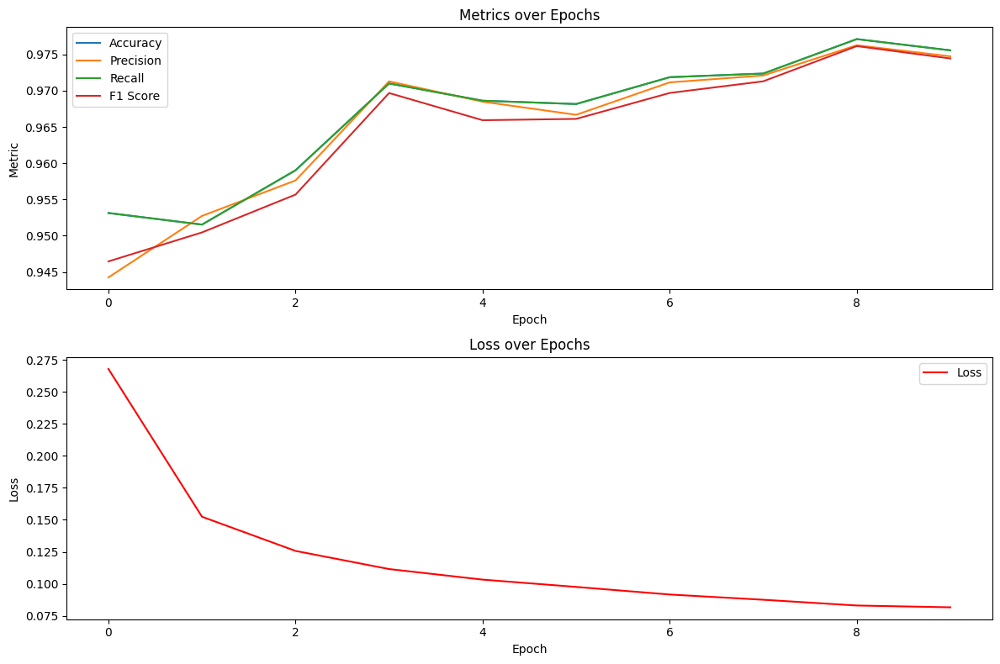

In [12]:
plot_metrics(accuracies, precisions, recalls, f1_scores, losses, "lstmfcn_metrics")

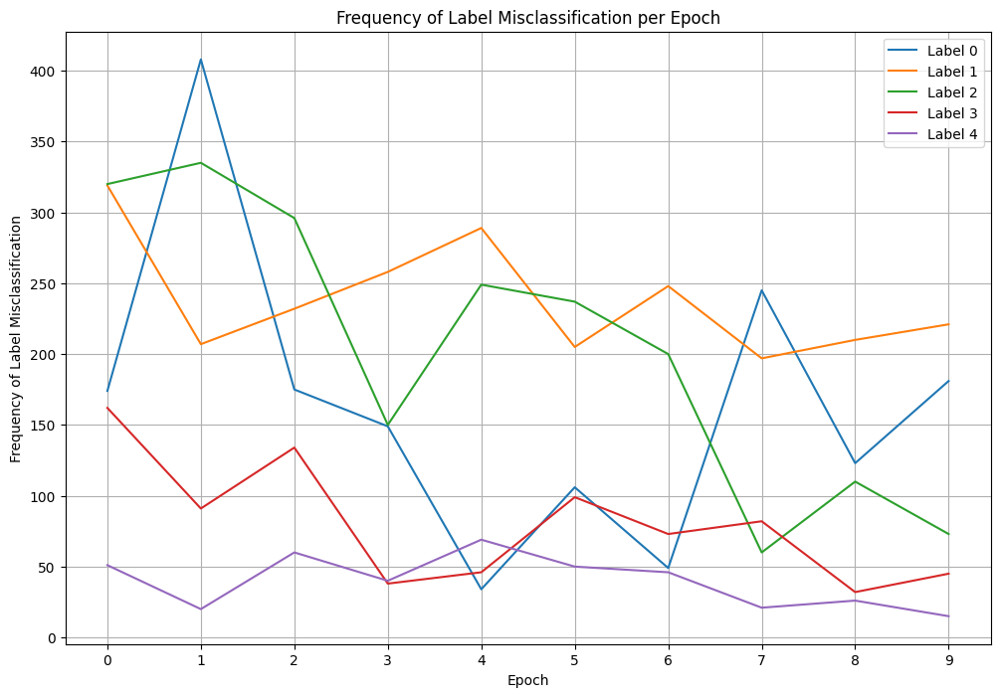

In [13]:
plot_incorrect_predictions(incorrect_indexes, test_loader, "lstmfcn_misclassification")

# LSTM LIME Analysis

In [14]:
# instances to explain
correct_samples, incorrect_samples = sample(model, test_loader, num_samples=25)


In [15]:
# LimeTabularExplainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train,    # raw data; not tensored or scaled
    feature_names=[f"timepoint_{i}" for i in range(X_train.shape[1])],
    class_names=[str(i) for i in np.unique(y_train)],
    mode="classification"
)

In [16]:
explanations_html = []
for test_idx in correct_samples:
    test_instance = X_test[test_idx]
    true_label = y_test[test_idx]
    explanation_html = explain_instance(
        model,
        explainer,
        test_instance,
        true_label,
        test_idx,
        y_train,
        num_features=200,
    )
    explanations_html.append(explanation_html)

with open("lime_lstmfcn_correct.html", "w") as file:
    for explanation_html in explanations_html:
        file.write(explanation_html + "<hr>")

2023-12-02 09:05:26,976 - root - INFO - Instance 21244: Predicted Label: 4, True Label: 4.0
2023-12-02 09:05:27,923 - root - INFO - Instance 21391: Predicted Label: 4, True Label: 4.0
2023-12-02 09:05:28,899 - root - INFO - Instance 6504: Predicted Label: 0, True Label: 0.0
2023-12-02 09:05:29,919 - root - INFO - Instance 6188: Predicted Label: 0, True Label: 0.0
2023-12-02 09:05:30,819 - root - INFO - Instance 313: Predicted Label: 0, True Label: 0.0
2023-12-02 09:05:31,752 - root - INFO - Instance 19804: Predicted Label: 2, True Label: 2.0
2023-12-02 09:05:32,867 - root - INFO - Instance 573: Predicted Label: 0, True Label: 0.0
2023-12-02 09:05:34,039 - root - INFO - Instance 6537: Predicted Label: 0, True Label: 0.0
2023-12-02 09:05:35,255 - root - INFO - Instance 11136: Predicted Label: 0, True Label: 0.0
2023-12-02 09:05:36,230 - root - INFO - Instance 1837: Predicted Label: 0, True Label: 0.0
2023-12-02 09:05:36,988 - root - INFO - Instance 796: Predicted Label: 0, True Label: 0.

In [17]:
explanations_html = []
for test_idx in incorrect_samples:
    test_instance = X_test[test_idx]
    true_label = y_test[test_idx]
    explanation_html = explain_instance(
        model,
        explainer,
        test_instance,
        true_label,
        test_idx,
        y_train,
        num_features=200,
    )
    explanations_html.append(explanation_html)

with open("lime_lstmfcn_incorrect.html", "w") as file:
    for explanation_html in explanations_html:
        file.write(explanation_html)
        file.write("<hr>")

2023-12-02 09:05:50,811 - root - INFO - Instance 4626: Predicted Label: 1, True Label: 0.0
2023-12-02 09:05:51,703 - root - INFO - Instance 18554: Predicted Label: 0, True Label: 1.0
2023-12-02 09:05:52,481 - root - INFO - Instance 20142: Predicted Label: 0, True Label: 3.0
2023-12-02 09:05:53,299 - root - INFO - Instance 18460: Predicted Label: 0, True Label: 1.0
2023-12-02 09:05:54,106 - root - INFO - Instance 8639: Predicted Label: 1, True Label: 0.0
2023-12-02 09:05:54,867 - root - INFO - Instance 21145: Predicted Label: 0, True Label: 4.0
2023-12-02 09:05:55,585 - root - INFO - Instance 18645: Predicted Label: 0, True Label: 1.0
2023-12-02 09:05:56,582 - root - INFO - Instance 6026: Predicted Label: 1, True Label: 0.0
2023-12-02 09:05:57,660 - root - INFO - Instance 9290: Predicted Label: 2, True Label: 0.0
2023-12-02 09:05:58,720 - root - INFO - Instance 18049: Predicted Label: 2, True Label: 0.0
2023-12-02 09:05:59,680 - root - INFO - Instance 991: Predicted Label: 1, True Label

In [18]:
idx = correct_samples[0]
sample_input = X_test_tensor[idx:idx+1]
visualize_model_graph(model, sample_input, file_name=f"computation_graph_lstmfcn_{idx}")

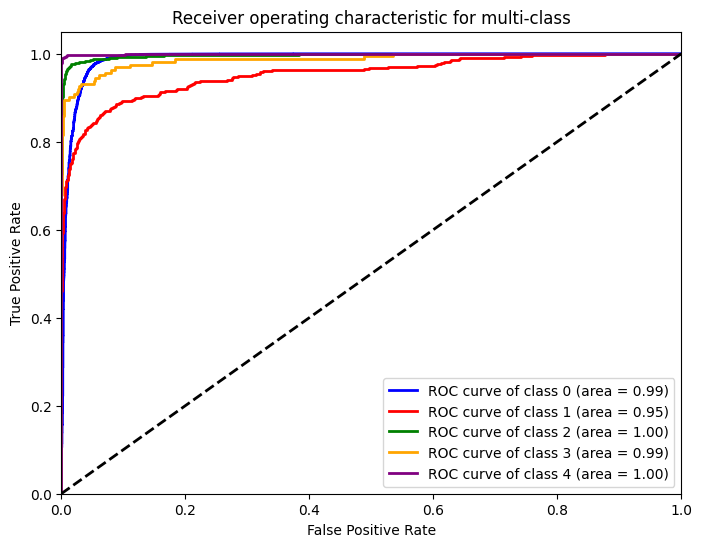

In [19]:
roc_plot(model, X_test, y_test, num_classes, "roc_lstmfcn")

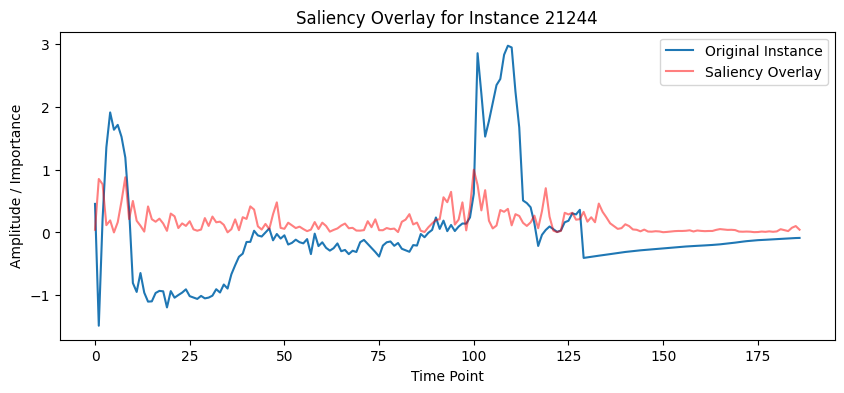

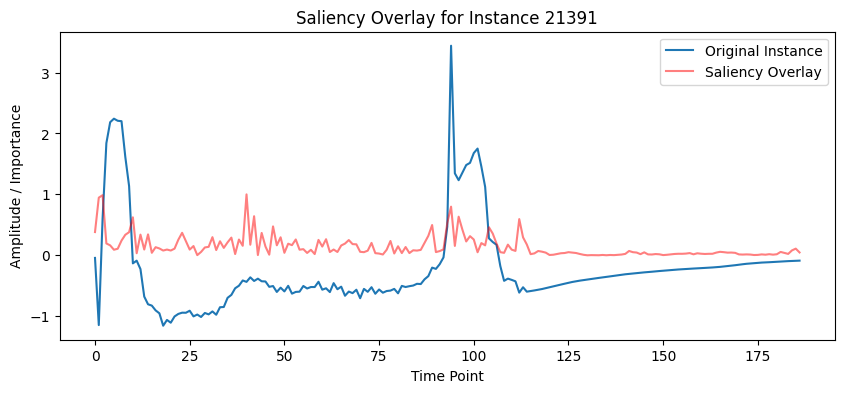

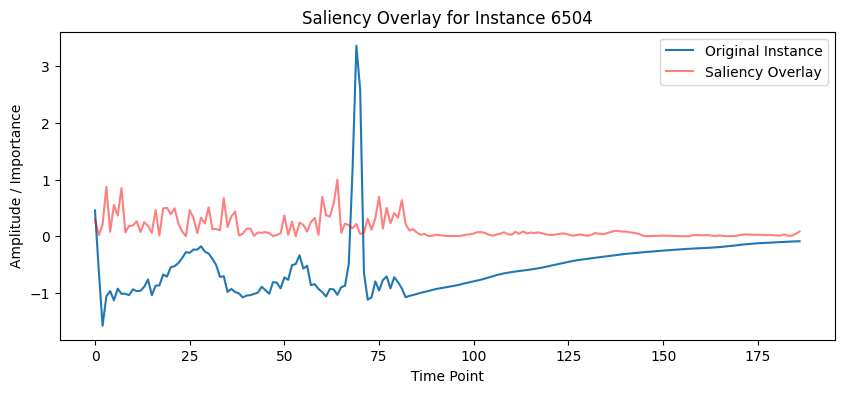

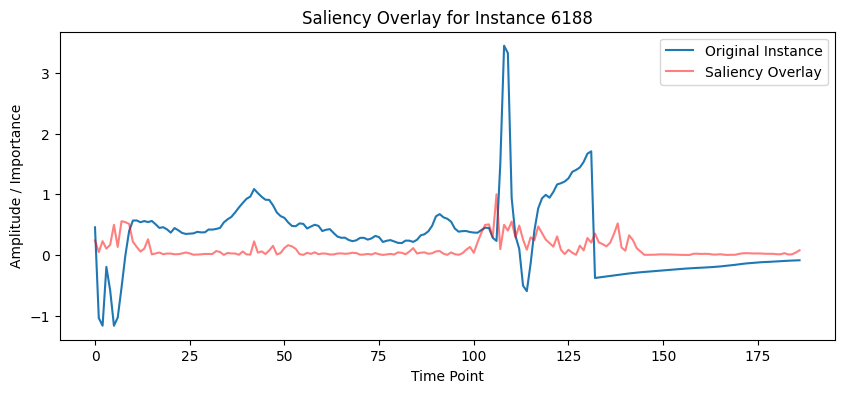

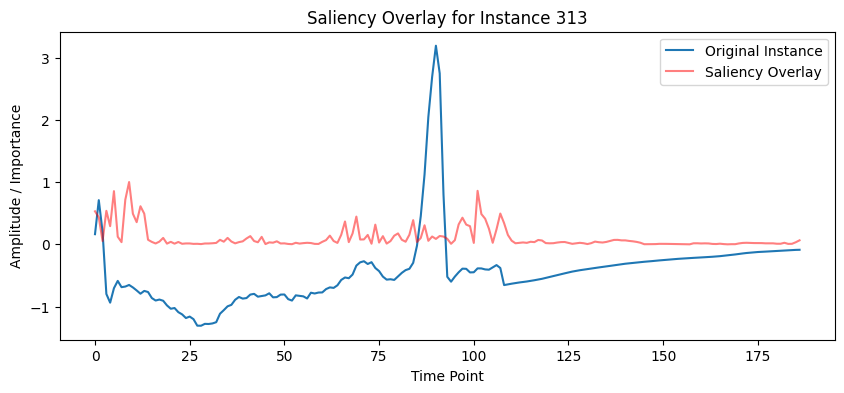

...

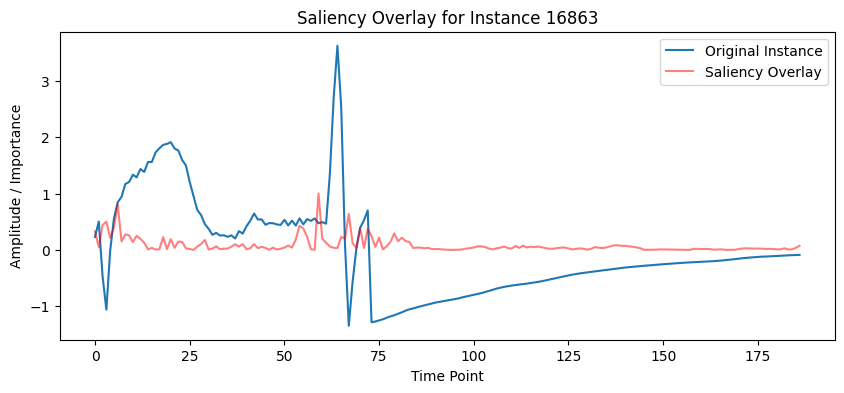

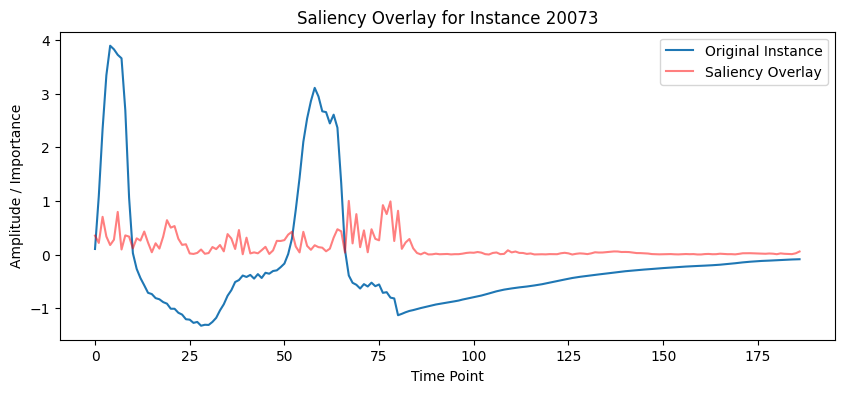

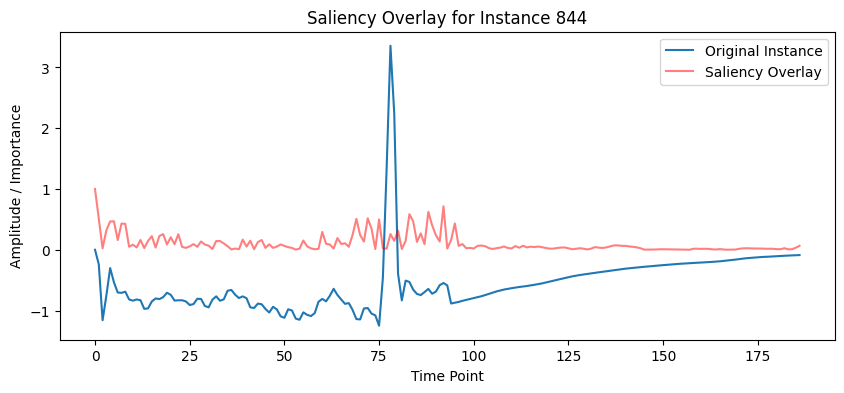

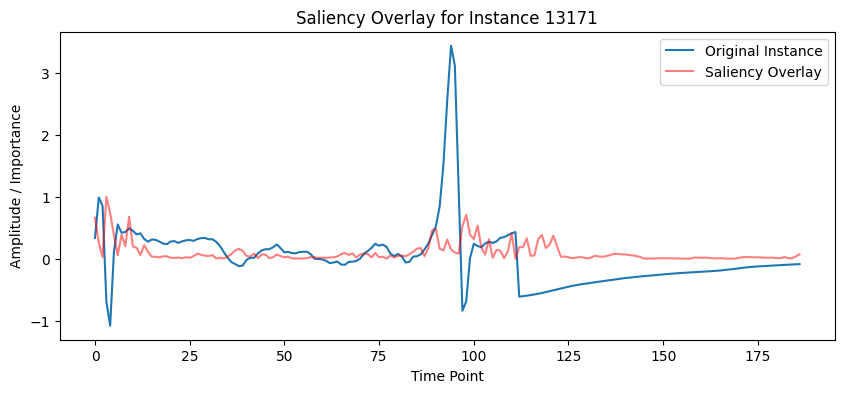

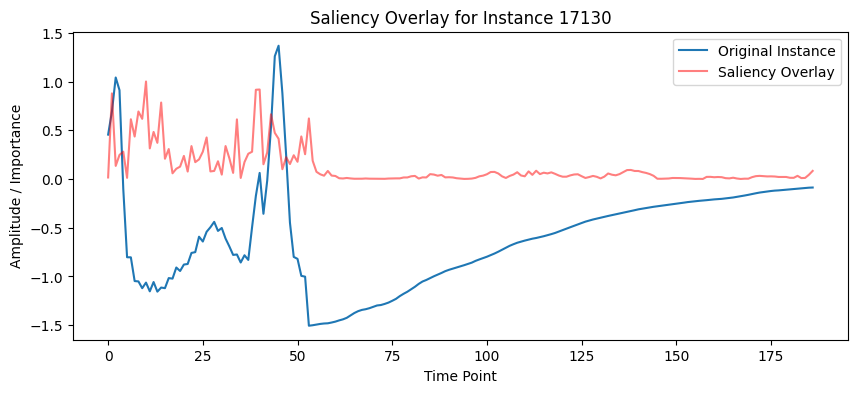

In [20]:
overlay_saliency_maps(model, X_test_tensor, correct_samples, "lstmfcn_correct")

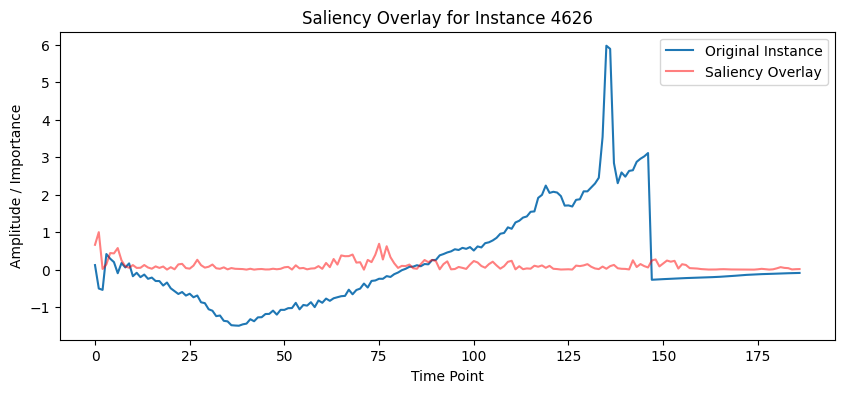

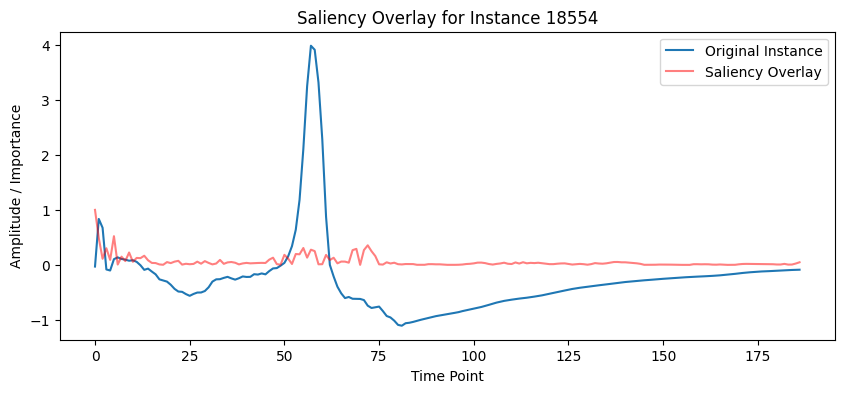

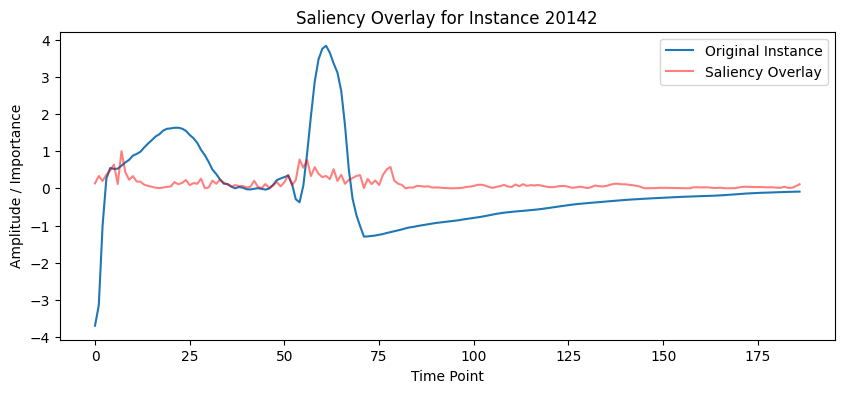

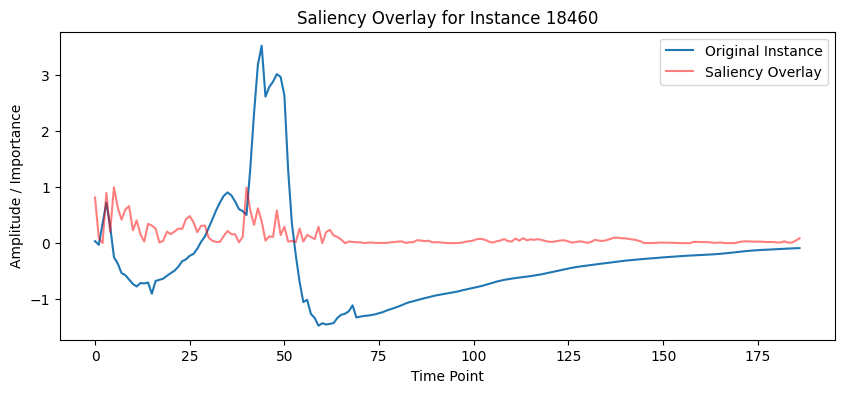

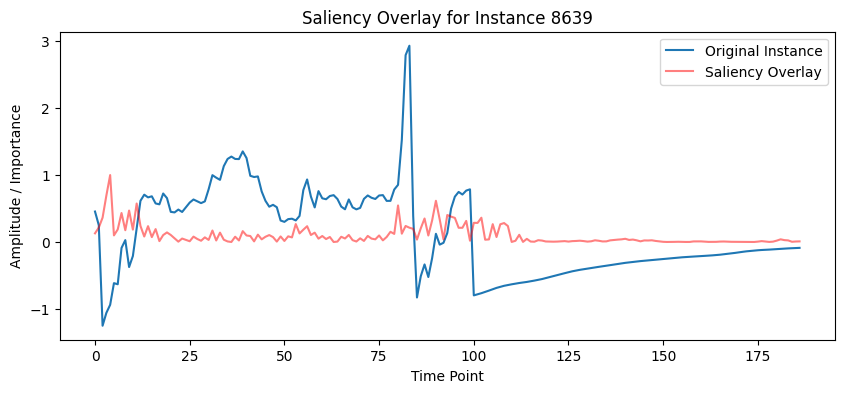

...

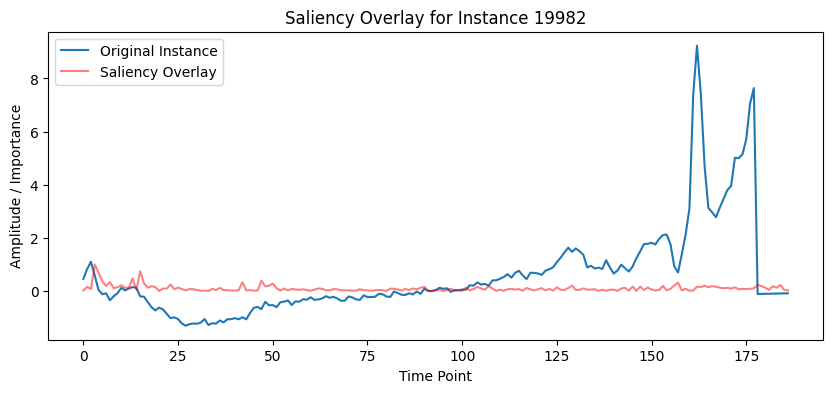

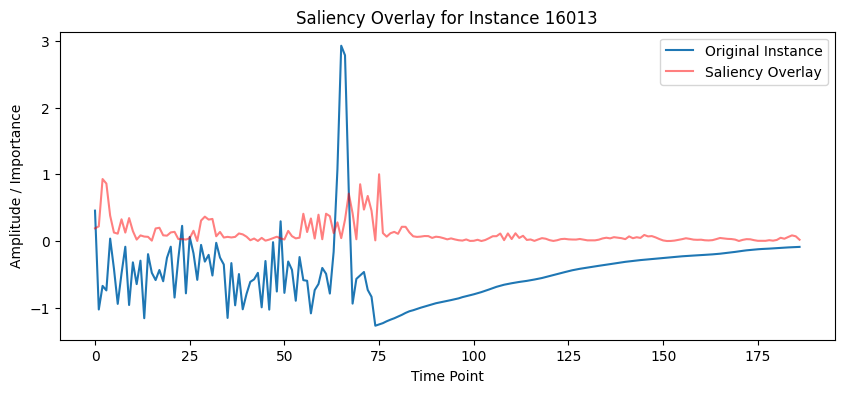

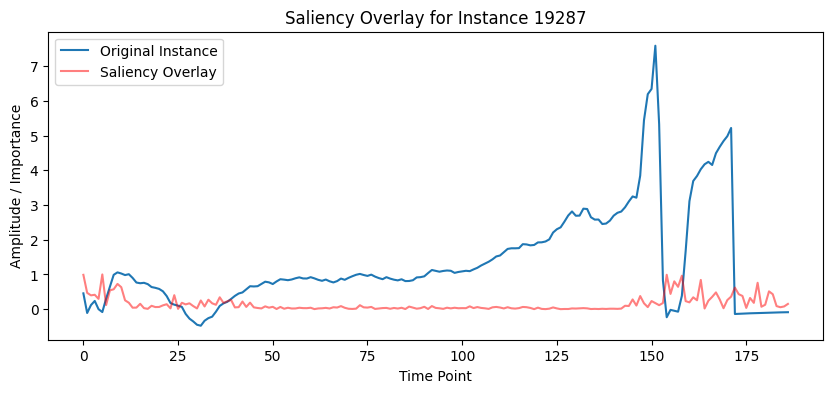

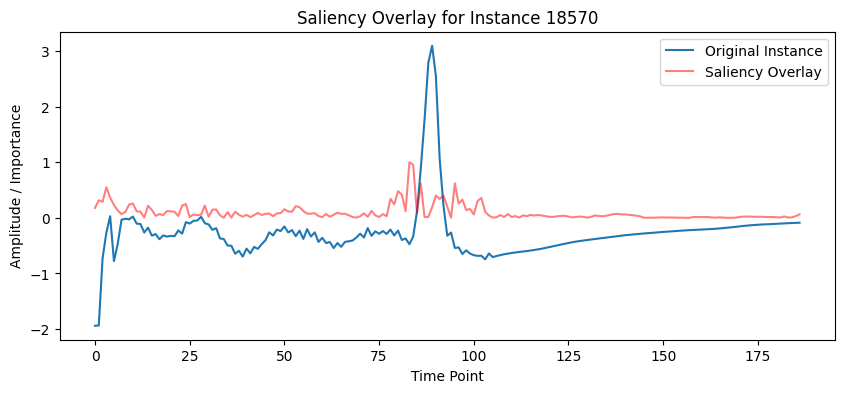

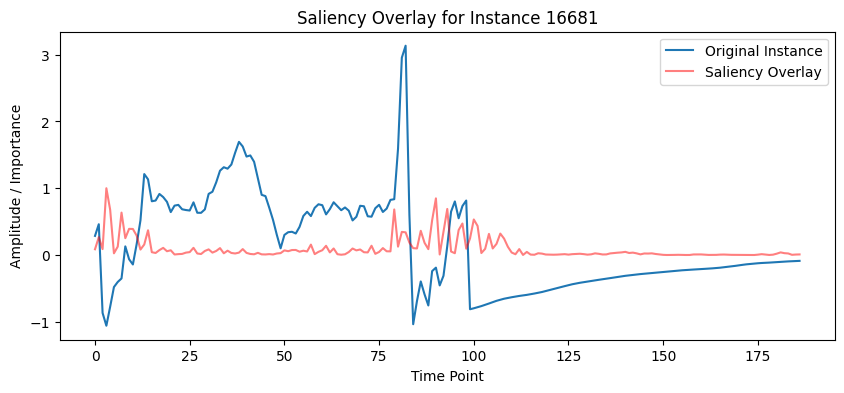

In [21]:
overlay_saliency_maps(model, X_test_tensor, incorrect_samples, "lstmfcn_incorrect")

# LSTM with Attention Experiment
### Description
Use the ECG dataset to train the LSTM+Attention model and evaluate its performance.

### Steps
1. set up the LSTM+Attention model
1. train the LSTM+Attention model
1. evaluate performance with accuracy, F1 score, precision, recall

In [22]:
# set parameters
input_dim = 1
hidden_dim = 128
num_layers = 2
num_classes = 5

attention_model = AttentionLSTMFCN(input_dim, num_classes, hidden_dim, num_layers)
attention_model.to(device)

# loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(attention_model.parameters(), lr=0.001)

print(attention_model)

AttentionLSTMFCN(
  (lstm): LSTM(1, 128, batch_first=True)
  (attention): SelfAttention(
    (query): Linear(in_features=128, out_features=128, bias=True)
    (key): Linear(in_features=128, out_features=128, bias=True)
    (value): Linear(in_features=128, out_features=128, bias=True)
  )
  (dropout): Dropout(p=0.8, inplace=False)
  (conv1): Conv1d(1, 128, kernel_size=(8,), stride=(1,), padding=same)
  (bn1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv1d(128, 256, kernel_size=(5,), stride=(1,), padding=same)
  (bn2): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv1d(256, 128, kernel_size=(3,), stride=(1,), padding=same)
  (bn3): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (global_avg_pooling): AdaptiveAvgPool1d(output_size=1)
  (fc): Linear(in_features=256, out_features=5, bias=True)
)


In [23]:
# store metrics for display
accuracies = []
precisions = []
recalls = []
f1_scores = []
losses = []
incorrect_indexes = []
attention_maps = []

# train
num_epochs = 10
for epoch in range(num_epochs):
    attention_model.train()
    total_loss = 0

    for i, (inputs, labels) in enumerate(train_loader):
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = attention_model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

        if (i+1) % 100 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(train_loader)}], Loss: {loss.item():.4f}")

    accuracy, precision, recall, f1, epoch_incorrect_indexes, epoch_attention_maps = evaluate(attention_model, test_loader, attention=True)

    # average loss for this epoch
    epoch_loss = total_loss / len(train_loader)
    losses.append(epoch_loss)

    # store metrics
    accuracies.append(accuracy)
    precisions.append(precision)
    recalls.append(recall)
    f1_scores.append(f1)
    incorrect_indexes.append(epoch_incorrect_indexes)
    attention_maps.append(epoch_attention_maps)


Epoch [1/10], Step [100/2737], Loss: 0.5467
Epoch [1/10], Step [200/2737], Loss: 0.6347
Epoch [1/10], Step [300/2737], Loss: 0.4088
Epoch [1/10], Step [400/2737], Loss: 0.3097
Epoch [1/10], Step [500/2737], Loss: 0.2345
Epoch [1/10], Step [600/2737], Loss: 0.0786
Epoch [1/10], Step [700/2737], Loss: 0.2601
Epoch [1/10], Step [800/2737], Loss: 0.3039
Epoch [1/10], Step [900/2737], Loss: 0.0719
Epoch [1/10], Step [1000/2737], Loss: 0.2355
Epoch [1/10], Step [1100/2737], Loss: 0.3292
Epoch [1/10], Step [1200/2737], Loss: 0.1573
Epoch [1/10], Step [1300/2737], Loss: 0.1879
Epoch [1/10], Step [1400/2737], Loss: 0.3093
Epoch [1/10], Step [1500/2737], Loss: 0.2153
Epoch [1/10], Step [1600/2737], Loss: 0.2399
Epoch [1/10], Step [1700/2737], Loss: 0.7435
Epoch [1/10], Step [1800/2737], Loss: 0.2861
Epoch [1/10], Step [1900/2737], Loss: 0.0324
Epoch [1/10], Step [2000/2737], Loss: 0.2943
Epoch [1/10], Step [2100/2737], Loss: 0.1342
Epoch [1/10], Step [2200/2737], Loss: 0.2078
Epoch [1/10], Step 

2023-12-02 09:07:27,012 - root - INFO - Accuracy: 95.66%
2023-12-02 09:07:27,013 - root - INFO - Precision: 0.9541
2023-12-02 09:07:27,014 - root - INFO - Recall: 0.9566
2023-12-02 09:07:27,015 - root - INFO - F1 Score: 0.9518


Epoch [2/10], Step [100/2737], Loss: 0.1877
Epoch [2/10], Step [200/2737], Loss: 0.0678
Epoch [2/10], Step [300/2737], Loss: 0.3536
Epoch [2/10], Step [400/2737], Loss: 0.0862
Epoch [2/10], Step [500/2737], Loss: 0.0451
Epoch [2/10], Step [600/2737], Loss: 0.0218
Epoch [2/10], Step [700/2737], Loss: 0.2144
Epoch [2/10], Step [800/2737], Loss: 0.0475
Epoch [2/10], Step [900/2737], Loss: 0.0825
Epoch [2/10], Step [1000/2737], Loss: 0.1254
Epoch [2/10], Step [1100/2737], Loss: 0.1190
Epoch [2/10], Step [1200/2737], Loss: 0.1836
Epoch [2/10], Step [1300/2737], Loss: 0.0261
Epoch [2/10], Step [1400/2737], Loss: 0.1656
Epoch [2/10], Step [1500/2737], Loss: 0.1896
Epoch [2/10], Step [1600/2737], Loss: 0.1204
Epoch [2/10], Step [1700/2737], Loss: 0.3252
Epoch [2/10], Step [1800/2737], Loss: 0.1226
Epoch [2/10], Step [1900/2737], Loss: 0.0337
Epoch [2/10], Step [2000/2737], Loss: 0.0503
Epoch [2/10], Step [2100/2737], Loss: 0.2484
Epoch [2/10], Step [2200/2737], Loss: 0.0855
Epoch [2/10], Step 

2023-12-02 09:07:48,578 - root - INFO - Accuracy: 95.48%
2023-12-02 09:07:48,579 - root - INFO - Precision: 0.9530
2023-12-02 09:07:48,580 - root - INFO - Recall: 0.9548
2023-12-02 09:07:48,581 - root - INFO - F1 Score: 0.9500


Epoch [3/10], Step [100/2737], Loss: 0.0886
Epoch [3/10], Step [200/2737], Loss: 0.2561
Epoch [3/10], Step [300/2737], Loss: 0.1237
Epoch [3/10], Step [400/2737], Loss: 0.0881
Epoch [3/10], Step [500/2737], Loss: 0.1353
Epoch [3/10], Step [600/2737], Loss: 0.0428
Epoch [3/10], Step [700/2737], Loss: 0.2485
Epoch [3/10], Step [800/2737], Loss: 0.0623
Epoch [3/10], Step [900/2737], Loss: 0.0599
Epoch [3/10], Step [1000/2737], Loss: 0.0922
Epoch [3/10], Step [1100/2737], Loss: 0.0376
Epoch [3/10], Step [1200/2737], Loss: 0.1109
Epoch [3/10], Step [1300/2737], Loss: 0.0285
Epoch [3/10], Step [1400/2737], Loss: 0.0529
Epoch [3/10], Step [1500/2737], Loss: 0.0221
Epoch [3/10], Step [1600/2737], Loss: 0.1727
Epoch [3/10], Step [1700/2737], Loss: 0.1103
Epoch [3/10], Step [1800/2737], Loss: 0.0964
Epoch [3/10], Step [1900/2737], Loss: 0.1179
Epoch [3/10], Step [2000/2737], Loss: 0.0206
Epoch [3/10], Step [2100/2737], Loss: 0.1605
Epoch [3/10], Step [2200/2737], Loss: 0.1113
Epoch [3/10], Step 

2023-12-02 09:08:09,543 - root - INFO - Accuracy: 96.09%
2023-12-02 09:08:09,544 - root - INFO - Precision: 0.9590
2023-12-02 09:08:09,545 - root - INFO - Recall: 0.9609
2023-12-02 09:08:09,546 - root - INFO - F1 Score: 0.9581


Epoch [4/10], Step [100/2737], Loss: 0.0536
Epoch [4/10], Step [200/2737], Loss: 0.0506
Epoch [4/10], Step [300/2737], Loss: 0.0656
Epoch [4/10], Step [400/2737], Loss: 0.0180
Epoch [4/10], Step [500/2737], Loss: 0.0293
Epoch [4/10], Step [600/2737], Loss: 0.1067
Epoch [4/10], Step [700/2737], Loss: 0.2648
Epoch [4/10], Step [800/2737], Loss: 0.1057
Epoch [4/10], Step [900/2737], Loss: 0.0414
Epoch [4/10], Step [1000/2737], Loss: 0.0554
Epoch [4/10], Step [1100/2737], Loss: 0.0736
Epoch [4/10], Step [1200/2737], Loss: 0.1610
Epoch [4/10], Step [1300/2737], Loss: 0.1505
Epoch [4/10], Step [1400/2737], Loss: 0.0442
Epoch [4/10], Step [1500/2737], Loss: 0.0199
Epoch [4/10], Step [1600/2737], Loss: 0.1068
Epoch [4/10], Step [1700/2737], Loss: 0.1407
Epoch [4/10], Step [1800/2737], Loss: 0.1502
Epoch [4/10], Step [1900/2737], Loss: 0.1258
Epoch [4/10], Step [2000/2737], Loss: 0.0391
Epoch [4/10], Step [2100/2737], Loss: 0.0152
Epoch [4/10], Step [2200/2737], Loss: 0.0736
Epoch [4/10], Step 

2023-12-02 09:08:30,480 - root - INFO - Accuracy: 96.81%
2023-12-02 09:08:30,481 - root - INFO - Precision: 0.9679
2023-12-02 09:08:30,484 - root - INFO - Recall: 0.9681
2023-12-02 09:08:30,485 - root - INFO - F1 Score: 0.9671


Epoch [5/10], Step [100/2737], Loss: 0.0232
Epoch [5/10], Step [200/2737], Loss: 0.1775
Epoch [5/10], Step [300/2737], Loss: 0.3144
Epoch [5/10], Step [400/2737], Loss: 0.2249
Epoch [5/10], Step [500/2737], Loss: 0.0284
Epoch [5/10], Step [600/2737], Loss: 0.1869
Epoch [5/10], Step [700/2737], Loss: 0.0766
Epoch [5/10], Step [800/2737], Loss: 0.0191
Epoch [5/10], Step [900/2737], Loss: 0.0615
Epoch [5/10], Step [1000/2737], Loss: 0.2505
Epoch [5/10], Step [1100/2737], Loss: 0.0317
Epoch [5/10], Step [1200/2737], Loss: 0.0131
Epoch [5/10], Step [1300/2737], Loss: 0.0301
Epoch [5/10], Step [1400/2737], Loss: 0.0722
Epoch [5/10], Step [1500/2737], Loss: 0.4918
Epoch [5/10], Step [1600/2737], Loss: 0.0686
Epoch [5/10], Step [1700/2737], Loss: 0.0738
Epoch [5/10], Step [1800/2737], Loss: 0.0347
Epoch [5/10], Step [1900/2737], Loss: 0.0529
Epoch [5/10], Step [2000/2737], Loss: 0.0523
Epoch [5/10], Step [2100/2737], Loss: 0.0239
Epoch [5/10], Step [2200/2737], Loss: 0.0596
Epoch [5/10], Step 

2023-12-02 09:08:51,613 - root - INFO - Accuracy: 96.95%
2023-12-02 09:08:51,614 - root - INFO - Precision: 0.9690
2023-12-02 09:08:51,615 - root - INFO - Recall: 0.9695
2023-12-02 09:08:51,615 - root - INFO - F1 Score: 0.9666


Epoch [6/10], Step [100/2737], Loss: 0.1206
Epoch [6/10], Step [200/2737], Loss: 0.0438
Epoch [6/10], Step [300/2737], Loss: 0.0411
Epoch [6/10], Step [400/2737], Loss: 0.0867
Epoch [6/10], Step [500/2737], Loss: 0.0415
Epoch [6/10], Step [600/2737], Loss: 0.0950
Epoch [6/10], Step [700/2737], Loss: 0.1566
Epoch [6/10], Step [800/2737], Loss: 0.0179
Epoch [6/10], Step [900/2737], Loss: 0.0056
Epoch [6/10], Step [1000/2737], Loss: 0.0484
Epoch [6/10], Step [1100/2737], Loss: 0.0408
Epoch [6/10], Step [1200/2737], Loss: 0.0888
Epoch [6/10], Step [1300/2737], Loss: 0.0528
Epoch [6/10], Step [1400/2737], Loss: 0.0716
Epoch [6/10], Step [1500/2737], Loss: 0.0733
Epoch [6/10], Step [1600/2737], Loss: 0.3405
Epoch [6/10], Step [1700/2737], Loss: 0.0277
Epoch [6/10], Step [1800/2737], Loss: 0.0733
Epoch [6/10], Step [1900/2737], Loss: 0.0210
Epoch [6/10], Step [2000/2737], Loss: 0.1344
Epoch [6/10], Step [2100/2737], Loss: 0.0374
Epoch [6/10], Step [2200/2737], Loss: 0.0206
Epoch [6/10], Step 

2023-12-02 09:09:12,586 - root - INFO - Accuracy: 94.12%
2023-12-02 09:09:12,587 - root - INFO - Precision: 0.9420
2023-12-02 09:09:12,588 - root - INFO - Recall: 0.9412
2023-12-02 09:09:12,589 - root - INFO - F1 Score: 0.9320


Epoch [7/10], Step [100/2737], Loss: 0.0971
Epoch [7/10], Step [200/2737], Loss: 0.0180
Epoch [7/10], Step [300/2737], Loss: 0.1514
Epoch [7/10], Step [400/2737], Loss: 0.0616
Epoch [7/10], Step [500/2737], Loss: 0.2116
Epoch [7/10], Step [600/2737], Loss: 0.0159
Epoch [7/10], Step [700/2737], Loss: 0.2155
Epoch [7/10], Step [800/2737], Loss: 0.0831
Epoch [7/10], Step [900/2737], Loss: 0.1350
Epoch [7/10], Step [1000/2737], Loss: 0.1616
Epoch [7/10], Step [1100/2737], Loss: 0.0522
Epoch [7/10], Step [1200/2737], Loss: 0.1631
Epoch [7/10], Step [1300/2737], Loss: 0.0248
Epoch [7/10], Step [1400/2737], Loss: 0.0532
Epoch [7/10], Step [1500/2737], Loss: 0.2632
Epoch [7/10], Step [1600/2737], Loss: 0.1712
Epoch [7/10], Step [1700/2737], Loss: 0.1116
Epoch [7/10], Step [1800/2737], Loss: 0.1542
Epoch [7/10], Step [1900/2737], Loss: 0.0329
Epoch [7/10], Step [2000/2737], Loss: 0.0579
Epoch [7/10], Step [2100/2737], Loss: 0.0167
Epoch [7/10], Step [2200/2737], Loss: 0.0647
Epoch [7/10], Step 

2023-12-02 09:09:33,803 - root - INFO - Accuracy: 97.72%
2023-12-02 09:09:33,804 - root - INFO - Precision: 0.9764
2023-12-02 09:09:33,805 - root - INFO - Recall: 0.9772
2023-12-02 09:09:33,806 - root - INFO - F1 Score: 0.9760


Epoch [8/10], Step [100/2737], Loss: 0.0152
Epoch [8/10], Step [200/2737], Loss: 0.1658
Epoch [8/10], Step [300/2737], Loss: 0.1903
Epoch [8/10], Step [400/2737], Loss: 0.2107
Epoch [8/10], Step [500/2737], Loss: 0.0901
Epoch [8/10], Step [600/2737], Loss: 0.1746
Epoch [8/10], Step [700/2737], Loss: 0.0901
Epoch [8/10], Step [800/2737], Loss: 0.0747
Epoch [8/10], Step [900/2737], Loss: 0.0846
Epoch [8/10], Step [1000/2737], Loss: 0.0111
Epoch [8/10], Step [1100/2737], Loss: 0.0185
Epoch [8/10], Step [1200/2737], Loss: 0.0262
Epoch [8/10], Step [1300/2737], Loss: 0.0867
Epoch [8/10], Step [1400/2737], Loss: 0.0162
Epoch [8/10], Step [1500/2737], Loss: 0.0123
Epoch [8/10], Step [1600/2737], Loss: 0.0163
Epoch [8/10], Step [1700/2737], Loss: 0.0779
Epoch [8/10], Step [1800/2737], Loss: 0.0284
Epoch [8/10], Step [1900/2737], Loss: 0.0277
Epoch [8/10], Step [2000/2737], Loss: 0.0372
Epoch [8/10], Step [2100/2737], Loss: 0.1441
Epoch [8/10], Step [2200/2737], Loss: 0.0568
Epoch [8/10], Step 

2023-12-02 09:09:55,699 - root - INFO - Accuracy: 97.30%
2023-12-02 09:09:55,701 - root - INFO - Precision: 0.9727
2023-12-02 09:09:55,702 - root - INFO - Recall: 0.9730
2023-12-02 09:09:55,703 - root - INFO - F1 Score: 0.9706


Epoch [9/10], Step [100/2737], Loss: 0.1251
Epoch [9/10], Step [200/2737], Loss: 0.0078
Epoch [9/10], Step [300/2737], Loss: 0.2432
Epoch [9/10], Step [400/2737], Loss: 0.0093
Epoch [9/10], Step [500/2737], Loss: 0.1626
Epoch [9/10], Step [600/2737], Loss: 0.1489
Epoch [9/10], Step [700/2737], Loss: 0.0987
Epoch [9/10], Step [800/2737], Loss: 0.1563
Epoch [9/10], Step [900/2737], Loss: 0.0681
Epoch [9/10], Step [1000/2737], Loss: 0.0299
Epoch [9/10], Step [1100/2737], Loss: 0.0246
Epoch [9/10], Step [1200/2737], Loss: 0.0171
Epoch [9/10], Step [1300/2737], Loss: 0.0129
Epoch [9/10], Step [1400/2737], Loss: 0.0208
Epoch [9/10], Step [1500/2737], Loss: 0.7109
Epoch [9/10], Step [1600/2737], Loss: 0.0297
Epoch [9/10], Step [1700/2737], Loss: 0.0216
Epoch [9/10], Step [1800/2737], Loss: 0.0101
Epoch [9/10], Step [1900/2737], Loss: 0.0585
Epoch [9/10], Step [2000/2737], Loss: 0.2378
Epoch [9/10], Step [2100/2737], Loss: 0.0134
Epoch [9/10], Step [2200/2737], Loss: 0.1514
Epoch [9/10], Step 

2023-12-02 09:10:16,717 - root - INFO - Accuracy: 97.42%
2023-12-02 09:10:16,718 - root - INFO - Precision: 0.9746
2023-12-02 09:10:16,719 - root - INFO - Recall: 0.9742
2023-12-02 09:10:16,720 - root - INFO - F1 Score: 0.9739


Epoch [10/10], Step [100/2737], Loss: 0.1414
Epoch [10/10], Step [200/2737], Loss: 0.0249
Epoch [10/10], Step [300/2737], Loss: 0.0611
Epoch [10/10], Step [400/2737], Loss: 0.0673
Epoch [10/10], Step [500/2737], Loss: 0.0601
Epoch [10/10], Step [600/2737], Loss: 0.1099
Epoch [10/10], Step [700/2737], Loss: 0.0256
Epoch [10/10], Step [800/2737], Loss: 0.0316
Epoch [10/10], Step [900/2737], Loss: 0.1688
Epoch [10/10], Step [1000/2737], Loss: 0.0239
Epoch [10/10], Step [1100/2737], Loss: 0.1070
Epoch [10/10], Step [1200/2737], Loss: 0.0246
Epoch [10/10], Step [1300/2737], Loss: 0.1517
Epoch [10/10], Step [1400/2737], Loss: 0.1242
Epoch [10/10], Step [1500/2737], Loss: 0.0405
Epoch [10/10], Step [1600/2737], Loss: 0.3406
Epoch [10/10], Step [1700/2737], Loss: 0.2225
Epoch [10/10], Step [1800/2737], Loss: 0.0252
Epoch [10/10], Step [1900/2737], Loss: 0.0153
Epoch [10/10], Step [2000/2737], Loss: 0.1814
Epoch [10/10], Step [2100/2737], Loss: 0.0715
Epoch [10/10], Step [2200/2737], Loss: 0.06

2023-12-02 09:10:37,904 - root - INFO - Accuracy: 96.09%
2023-12-02 09:10:37,905 - root - INFO - Precision: 0.9671
2023-12-02 09:10:37,906 - root - INFO - Recall: 0.9609
2023-12-02 09:10:37,907 - root - INFO - F1 Score: 0.9631


In [24]:
torch.save(attention_model, "tsc_lstmfcn_attention.pth")

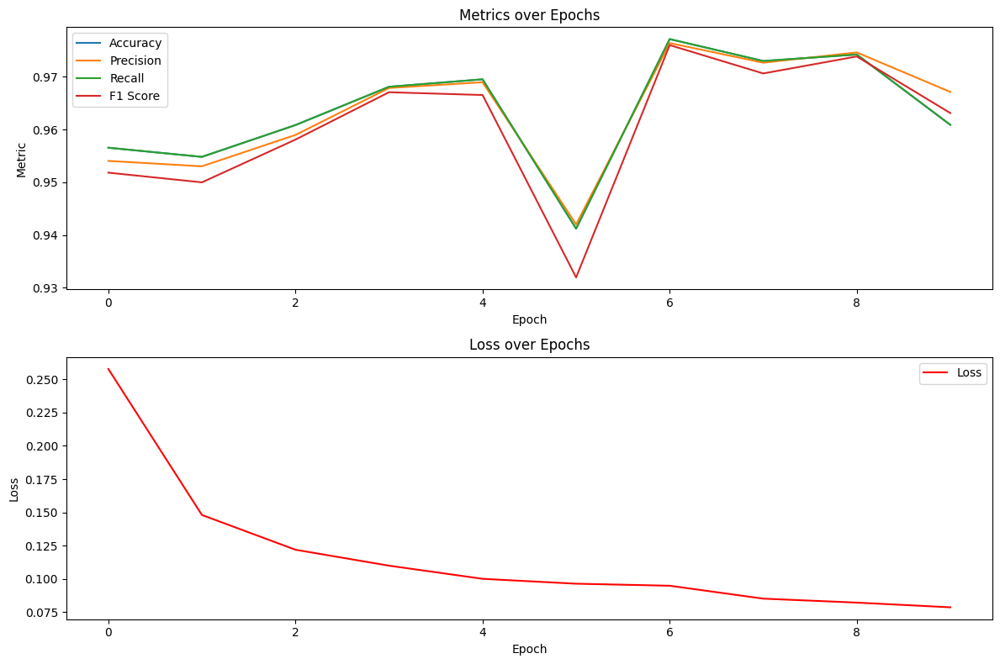

In [25]:
plot_metrics(accuracies, precisions, recalls, f1_scores, losses, "lstmfcn_attention_metrics")

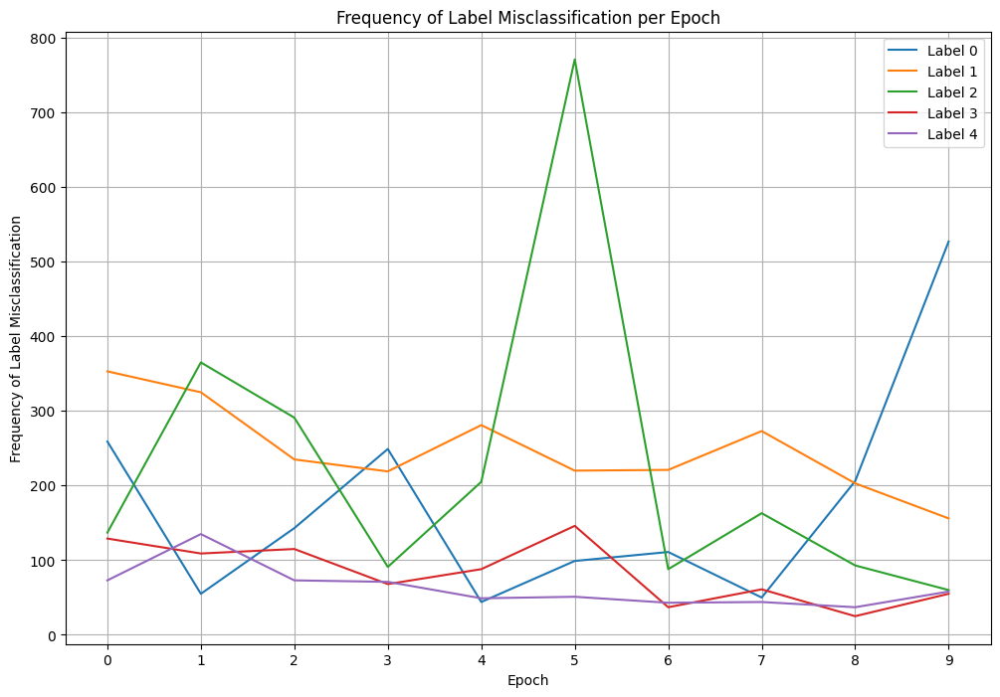

In [26]:
plot_incorrect_predictions(incorrect_indexes, test_loader, "lstmfcn_attention_misclassification")

In [27]:
idx = correct_samples[0]
sample_input = X_test_tensor[idx:idx+1]
visualize_model_graph(attention_model, sample_input, file_name=f"computation_graph_lstm_attention_{idx}")

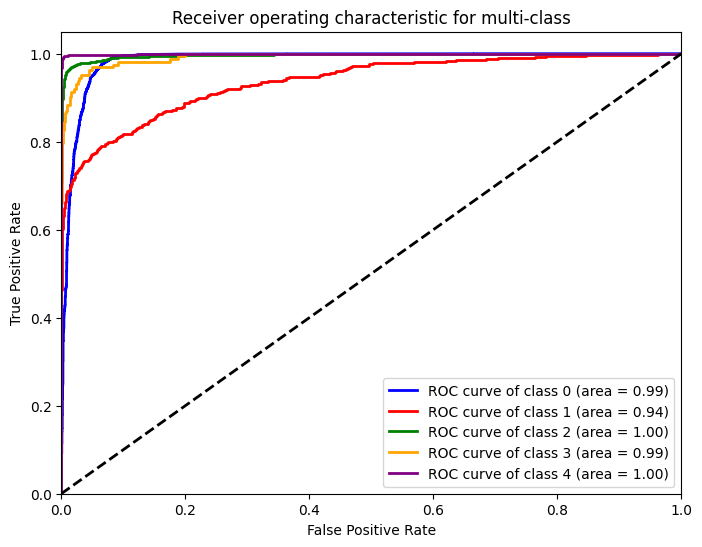

In [28]:
roc_plot(attention_model, X_test, y_test, num_classes, "roc_lstm_attention")

# LSTM with Attention LIME Analysis

In [29]:
explanations_html = []
for test_idx in correct_samples:
    test_instance = X_test[test_idx]
    true_label = y_test[test_idx]
    explanation_html = explain_instance(
        attention_model,
        explainer,
        test_instance,
        true_label,
        test_idx,
        y_train
    )
    explanations_html.append(explanation_html)

with open("lime_lstmfcn_attention_correct.html", "w") as file:
    for explanation_html in explanations_html:
        file.write(explanation_html + "<hr>")

2023-12-02 09:11:15,096 - root - INFO - Instance 21244: Predicted Label: 4, True Label: 4.0
2023-12-02 09:11:15,670 - root - INFO - Instance 21391: Predicted Label: 4, True Label: 4.0
2023-12-02 09:11:16,377 - root - INFO - Instance 6504: Predicted Label: 0, True Label: 0.0
2023-12-02 09:11:17,079 - root - INFO - Instance 6188: Predicted Label: 0, True Label: 0.0
2023-12-02 09:11:17,723 - root - INFO - Instance 313: Predicted Label: 1, True Label: 0.0
2023-12-02 09:11:18,337 - root - INFO - Instance 19804: Predicted Label: 2, True Label: 2.0
2023-12-02 09:11:19,057 - root - INFO - Instance 573: Predicted Label: 0, True Label: 0.0
2023-12-02 09:11:19,696 - root - INFO - Instance 6537: Predicted Label: 0, True Label: 0.0
2023-12-02 09:11:20,454 - root - INFO - Instance 11136: Predicted Label: 1, True Label: 0.0
2023-12-02 09:11:21,130 - root - INFO - Instance 1837: Predicted Label: 0, True Label: 0.0
2023-12-02 09:11:21,999 - root - INFO - Instance 796: Predicted Label: 0, True Label: 0.

In [30]:
explanations_html = []
for test_idx in incorrect_samples:
    test_instance = X_test[test_idx]
    true_label = y_test[test_idx]
    explanation_html = explain_instance(
        attention_model,
        explainer,
        test_instance,
        true_label,
        test_idx,
        y_train
    )
    explanations_html.append(explanation_html)

with open("lime_lstmfcn_attention_incorrect.html", "w") as file:
    for explanation_html in explanations_html:
        file.write(explanation_html + "<hr>")

2023-12-02 09:11:31,872 - root - INFO - Instance 4626: Predicted Label: 1, True Label: 0.0
2023-12-02 09:11:32,507 - root - INFO - Instance 18554: Predicted Label: 0, True Label: 1.0
2023-12-02 09:11:33,136 - root - INFO - Instance 20142: Predicted Label: 2, True Label: 3.0
2023-12-02 09:11:33,811 - root - INFO - Instance 18460: Predicted Label: 1, True Label: 1.0
2023-12-02 09:11:34,505 - root - INFO - Instance 8639: Predicted Label: 1, True Label: 0.0
2023-12-02 09:11:35,421 - root - INFO - Instance 21145: Predicted Label: 0, True Label: 4.0
2023-12-02 09:11:36,252 - root - INFO - Instance 18645: Predicted Label: 0, True Label: 1.0
2023-12-02 09:11:37,098 - root - INFO - Instance 6026: Predicted Label: 1, True Label: 0.0
2023-12-02 09:11:37,829 - root - INFO - Instance 9290: Predicted Label: 2, True Label: 0.0
2023-12-02 09:11:38,459 - root - INFO - Instance 18049: Predicted Label: 0, True Label: 0.0
2023-12-02 09:11:39,068 - root - INFO - Instance 991: Predicted Label: 1, True Label

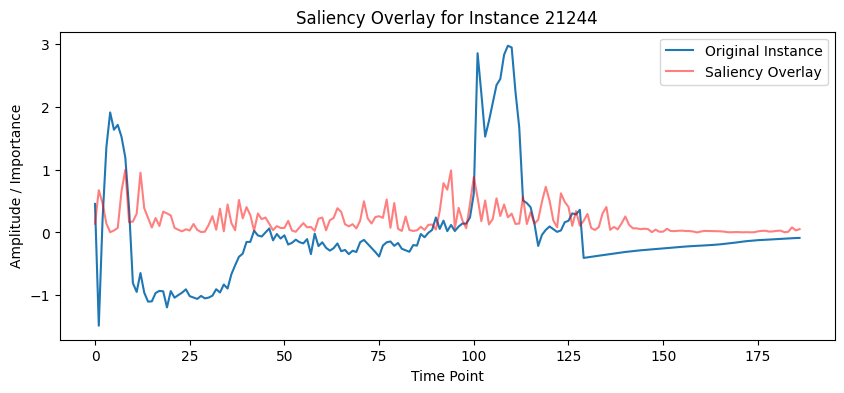

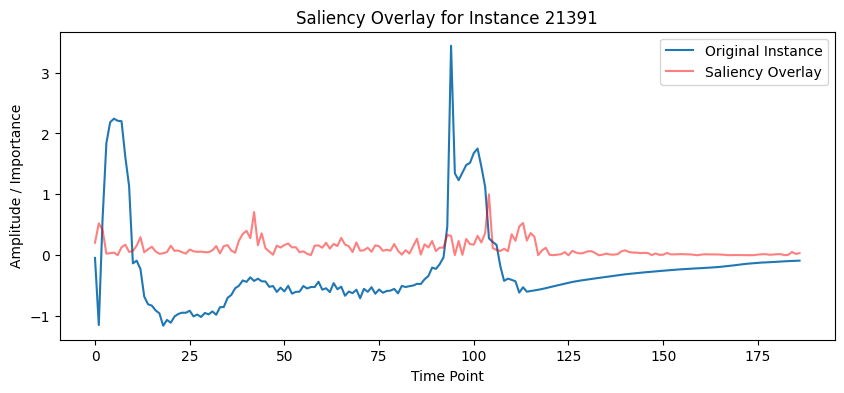

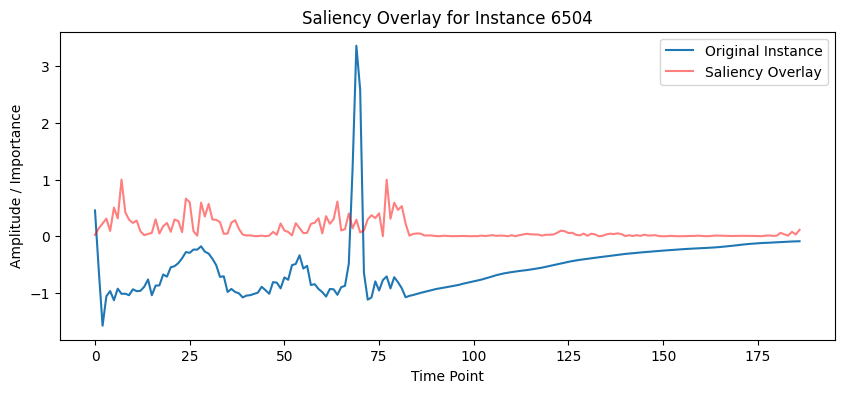

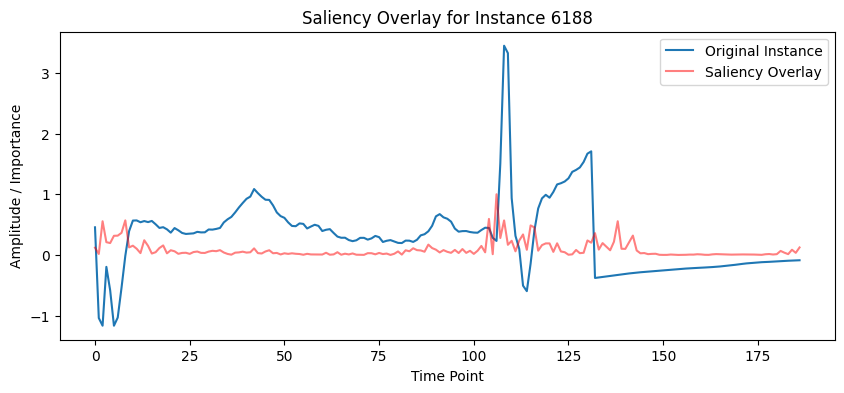

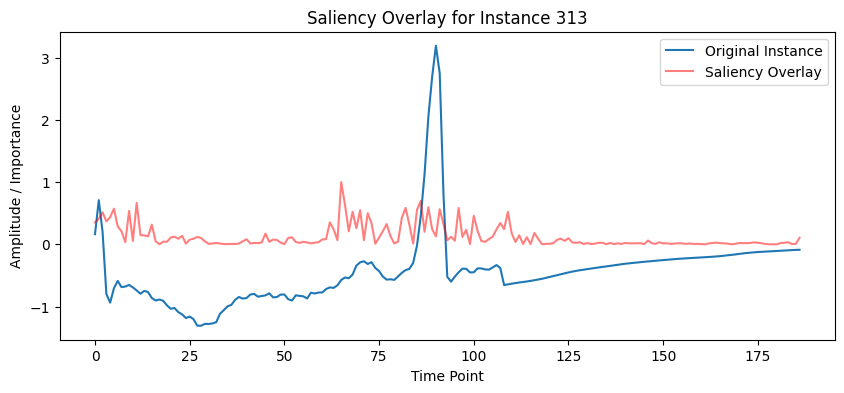

...

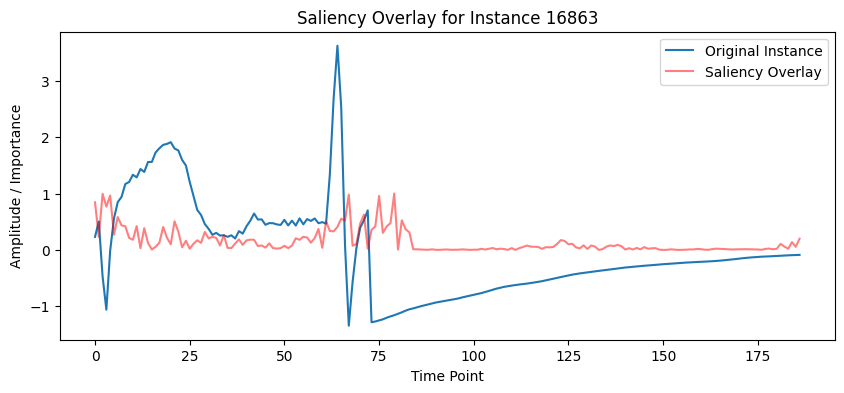

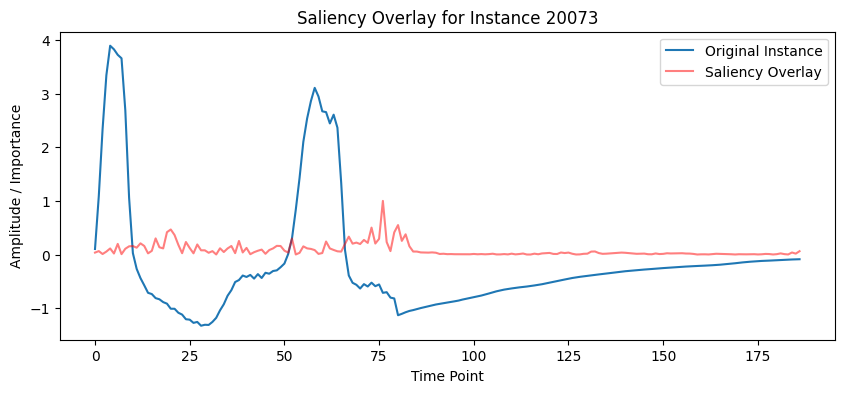

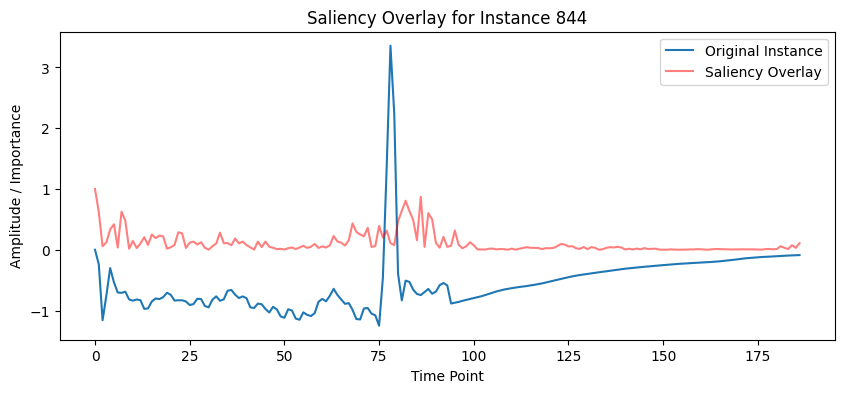

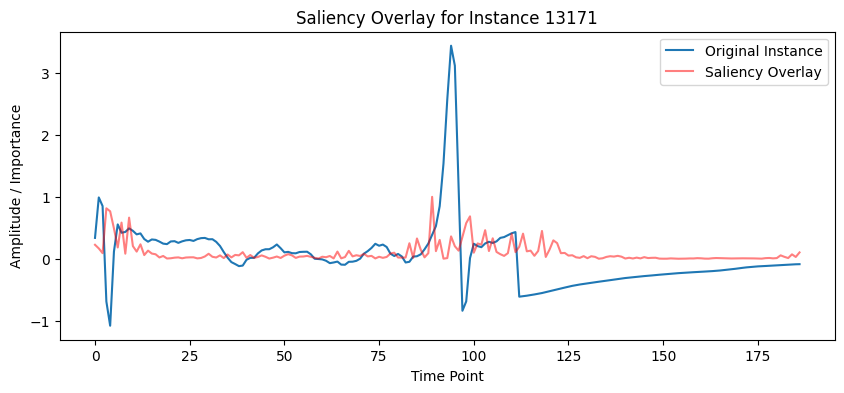

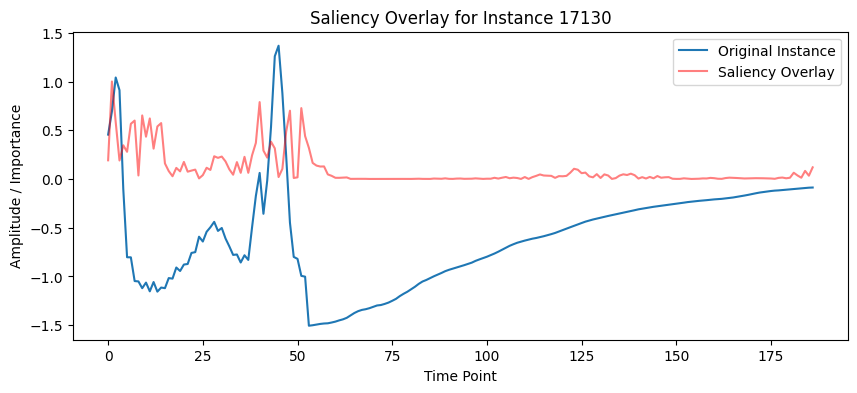

In [31]:
overlay_saliency_maps(attention_model, X_test_tensor, correct_samples, "lstm_attention_correct")

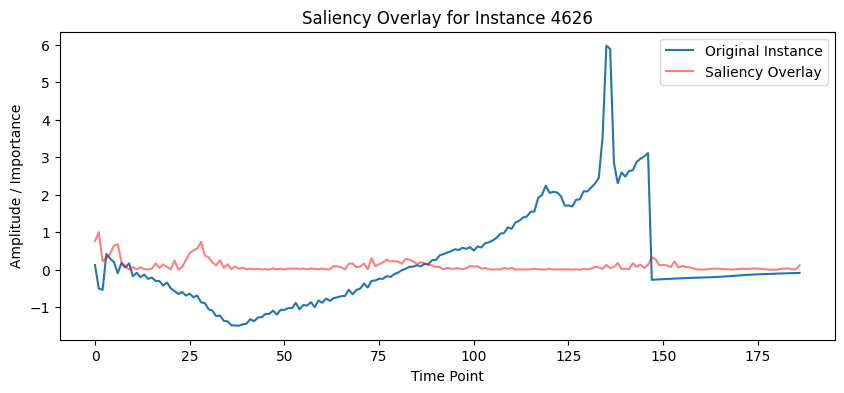

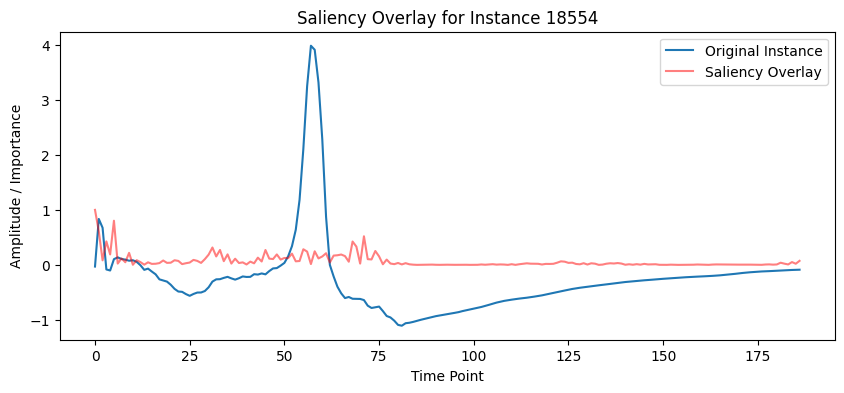

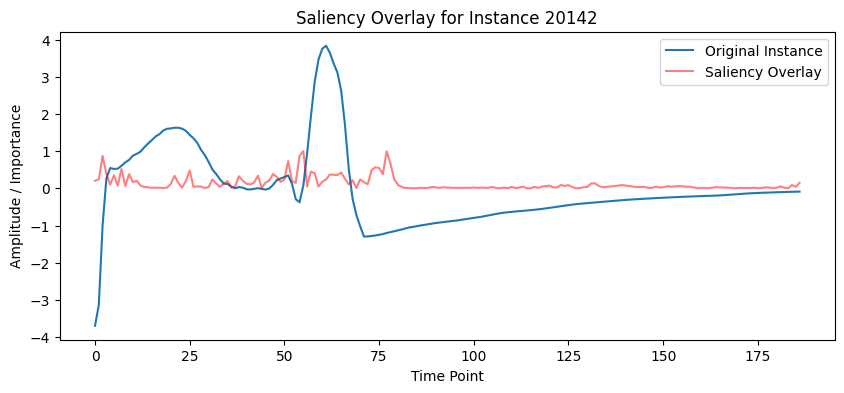

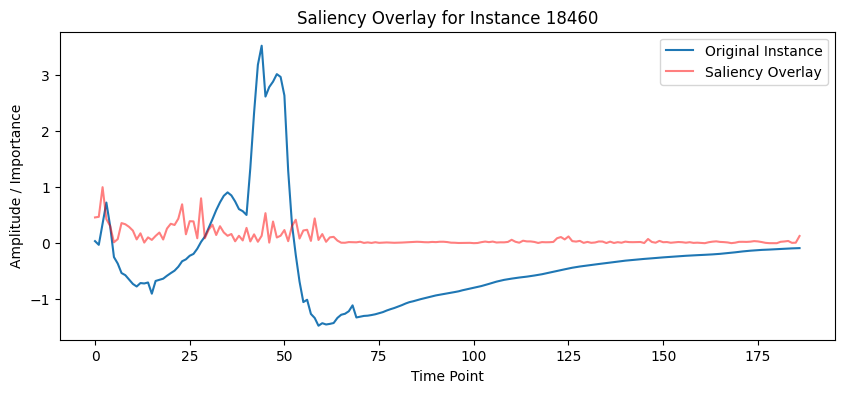

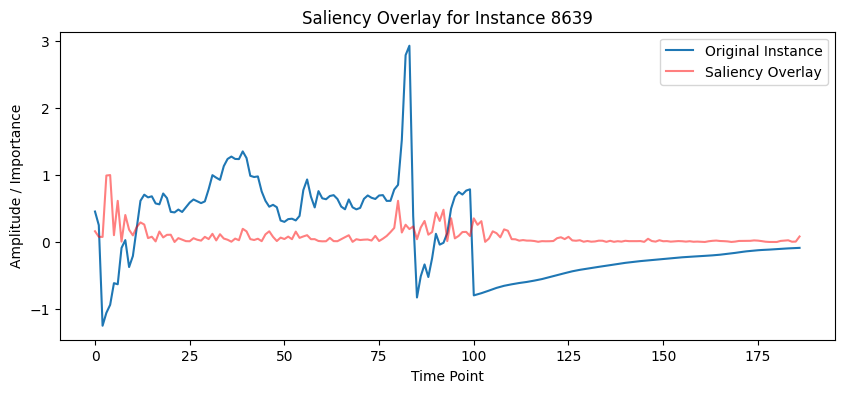

...

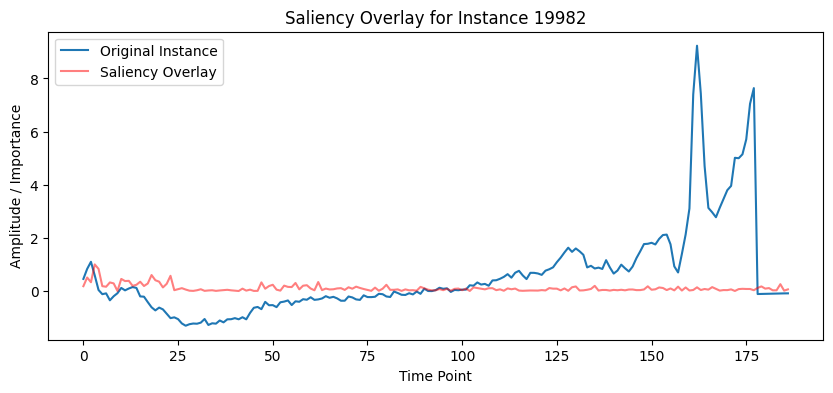

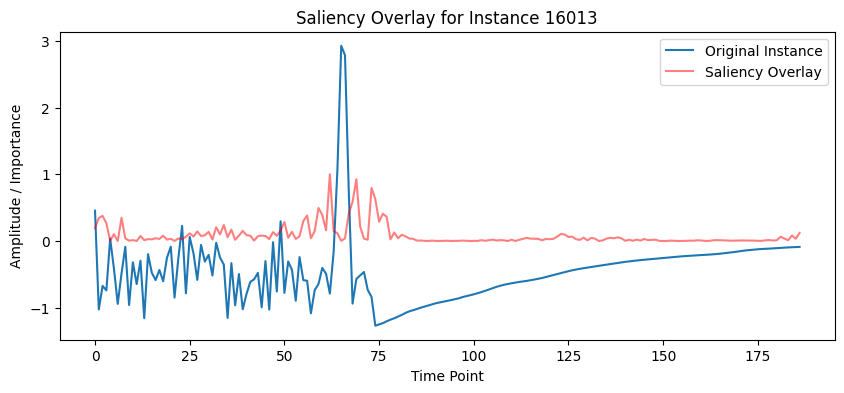

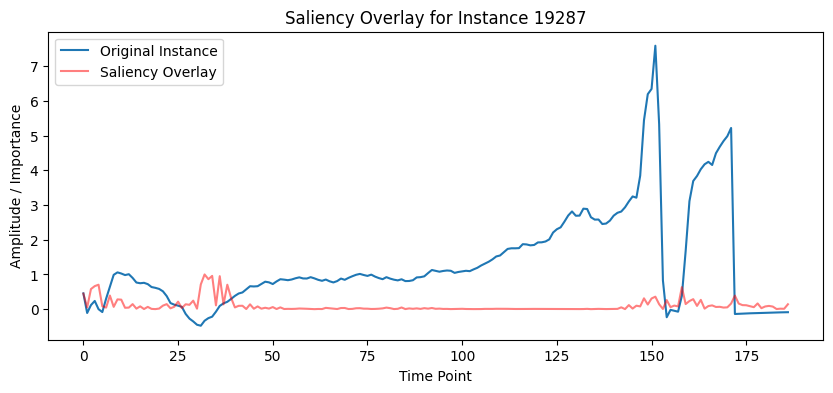

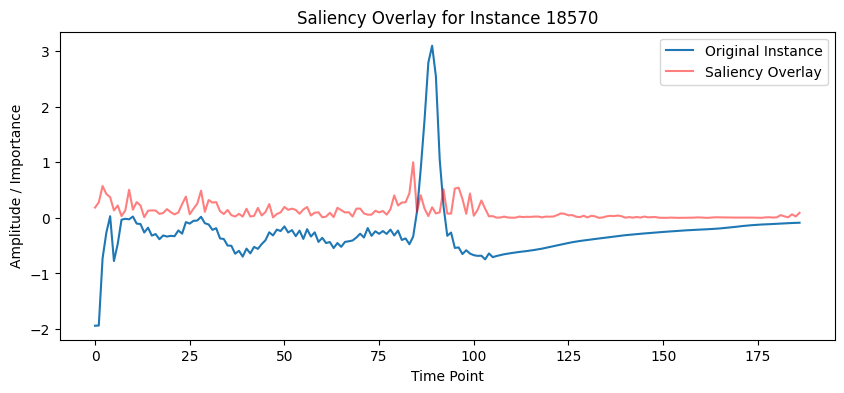

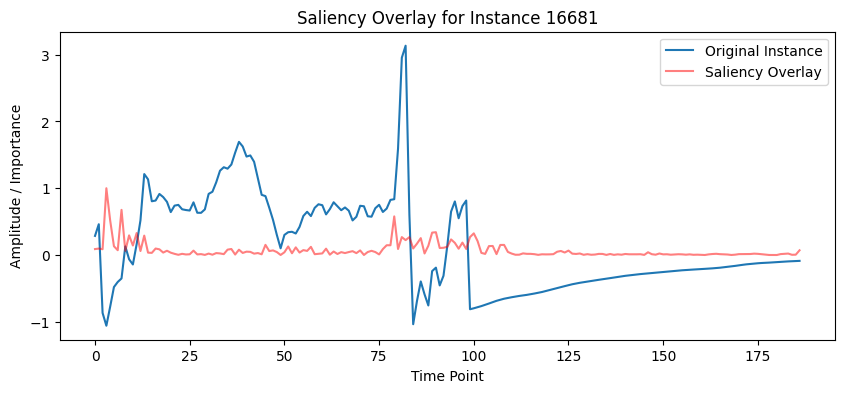

In [32]:
overlay_saliency_maps(attention_model, X_test_tensor, incorrect_samples, "lstm_attention_incorrect")

# Attention Weights Heatmap

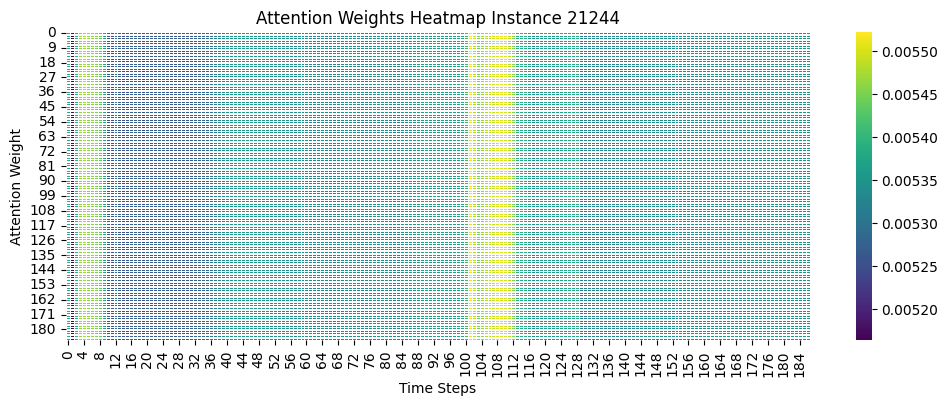

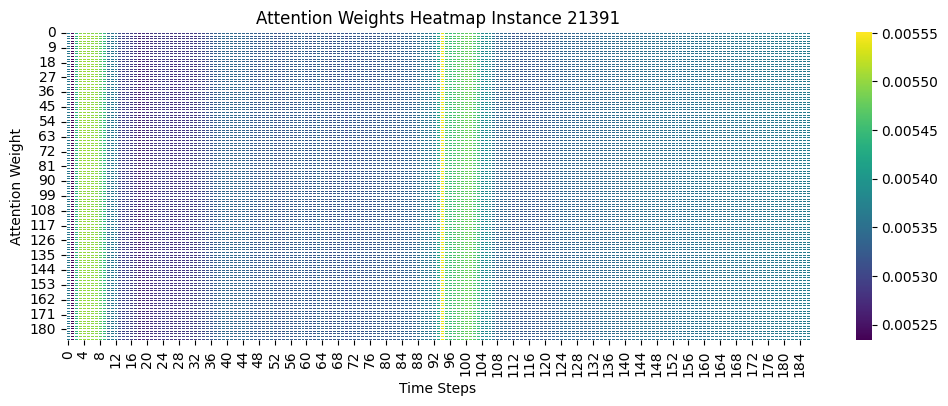

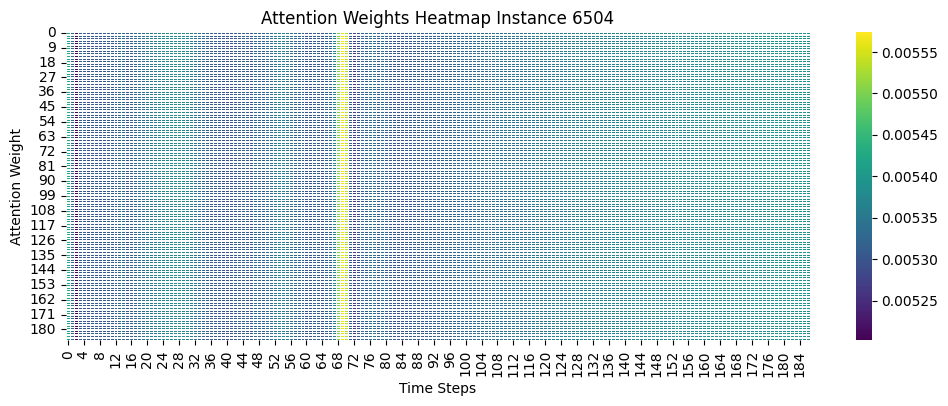

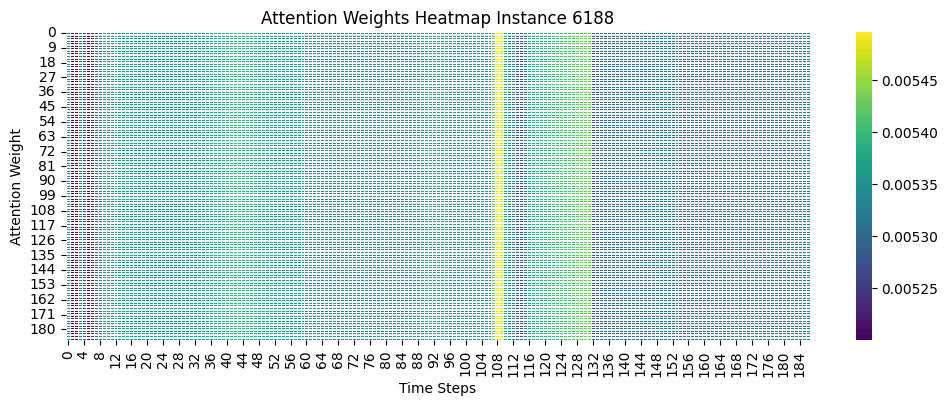

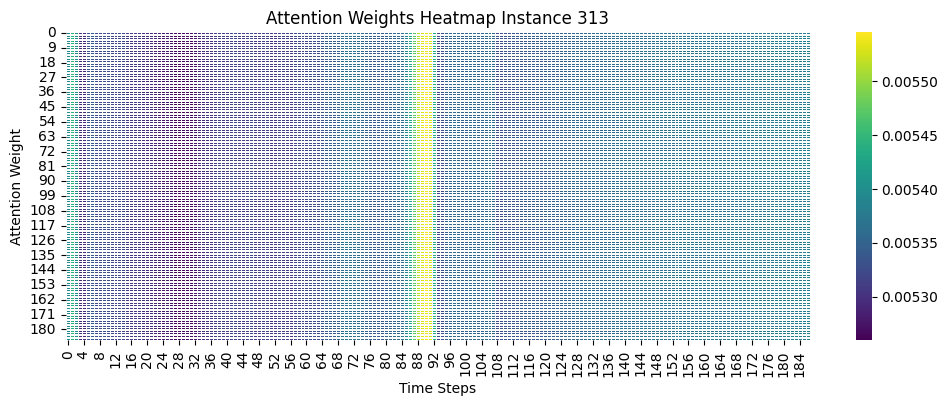

...

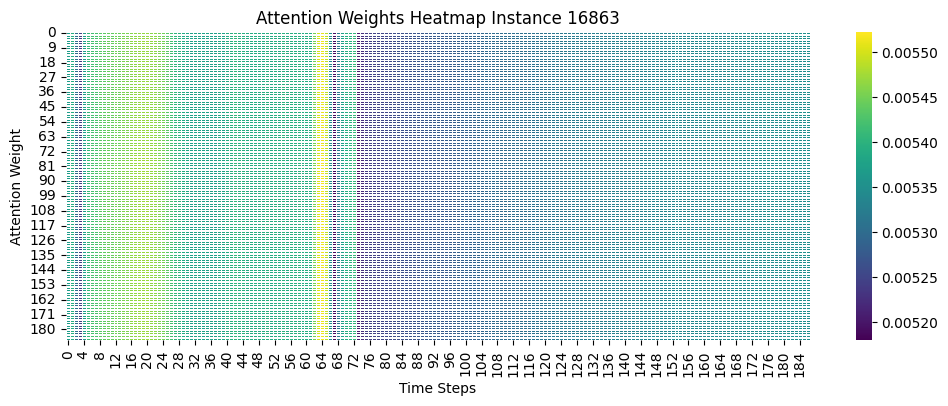

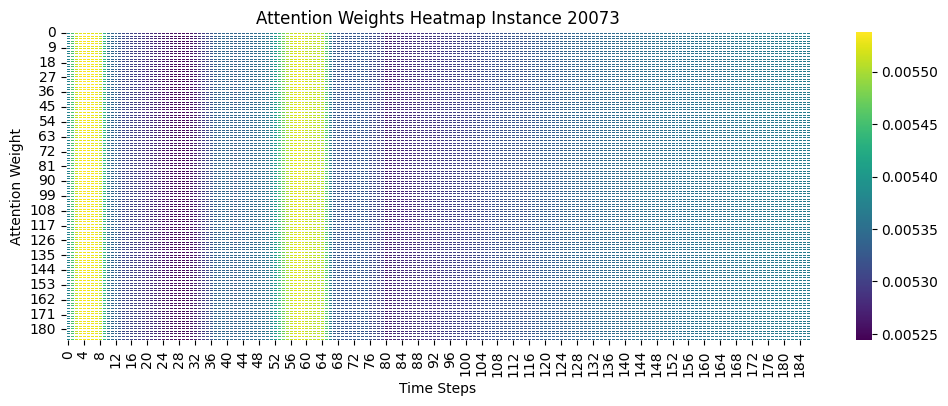

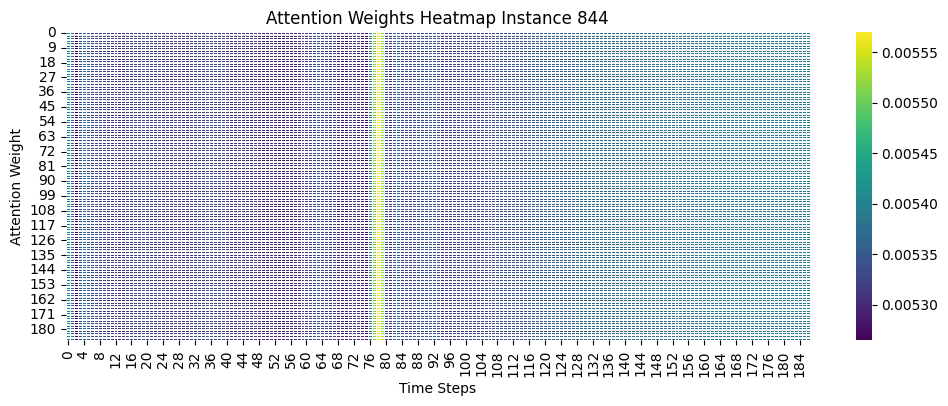

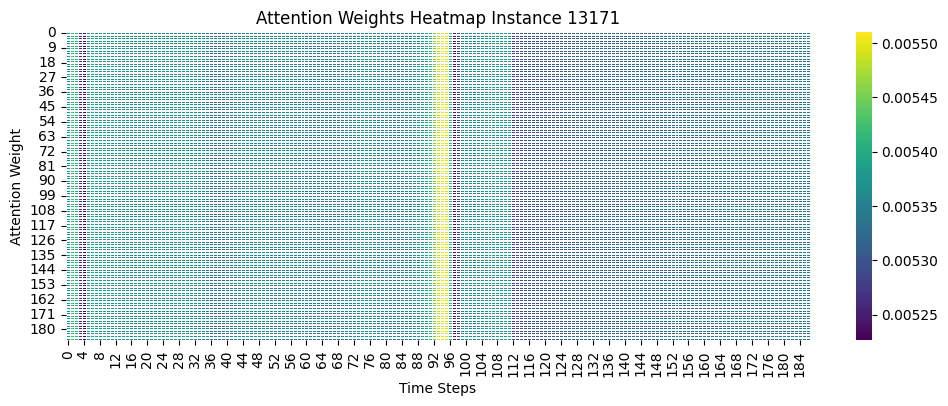

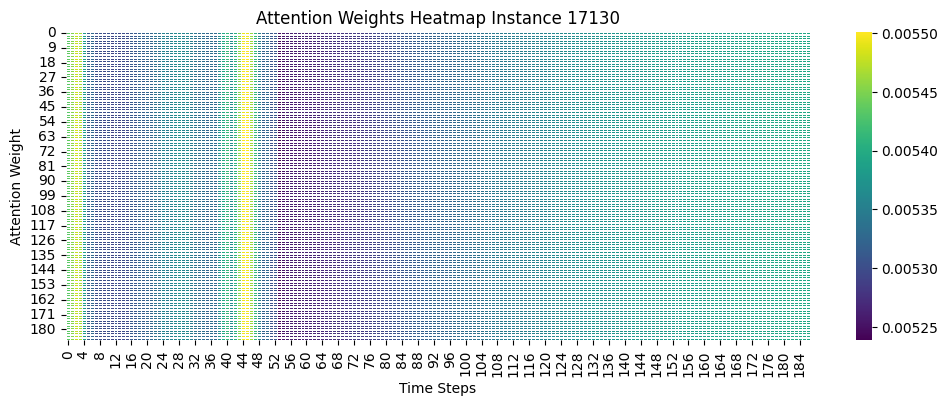

In [33]:
for sample_idx in correct_samples:
    sample_input = X_test_tensor[sample_idx].cpu().numpy()
    batch_weights = attention_maps[-1][sample_idx//batch_size]
    sample_attention = batch_weights[sample_idx%batch_size]

    # plot heatmap
    plt.figure(figsize=(12, 4))
    sns.heatmap(sample_attention, cmap="viridis", linewidths=0.5)
    plt.title(f"Attention Weights Heatmap Instance {sample_idx}")
    plt.xlabel("Time Steps")
    plt.ylabel("Attention Weight")

    plt.savefig(f"attention_weights_{sample_idx}")
    plt.show()

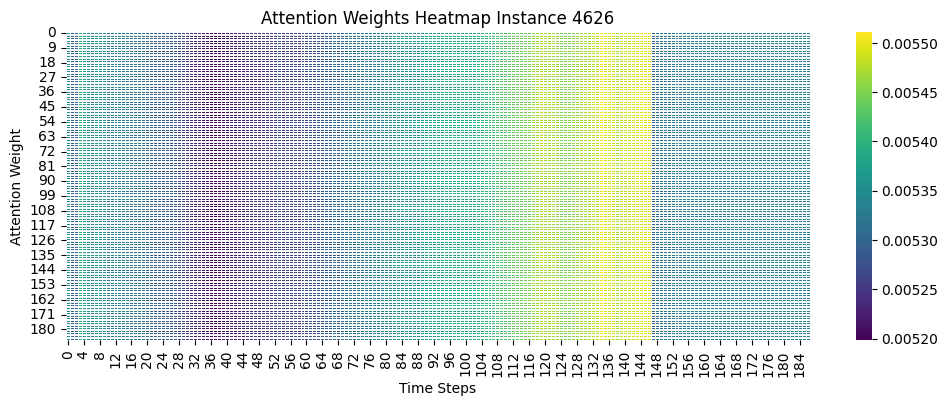

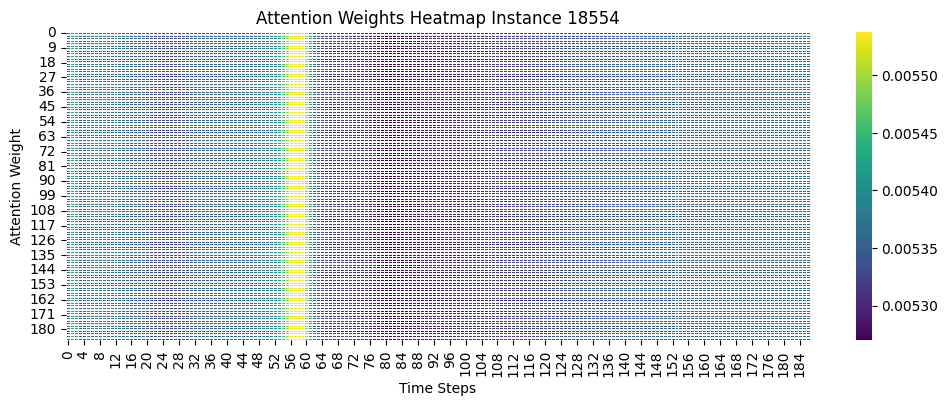

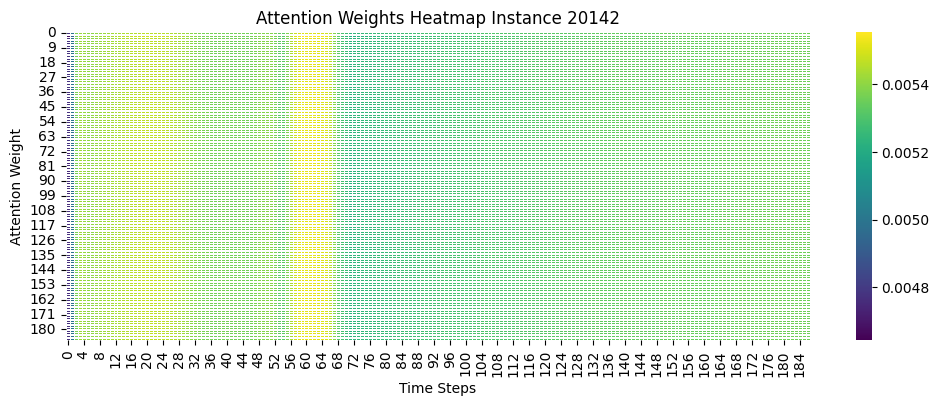

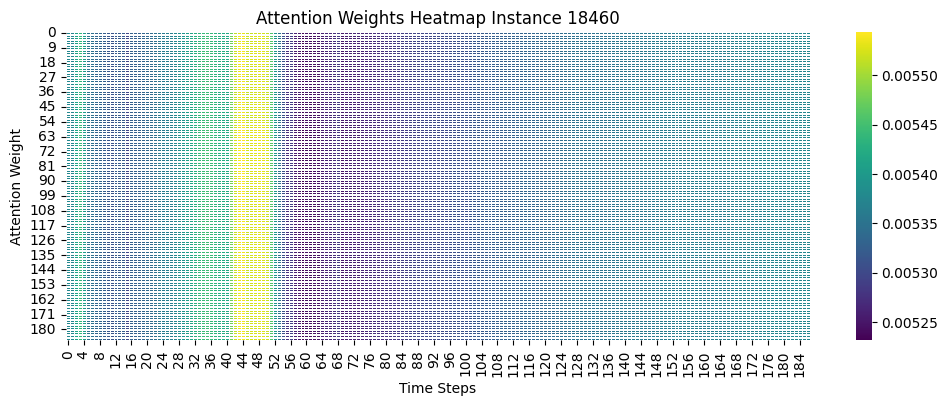

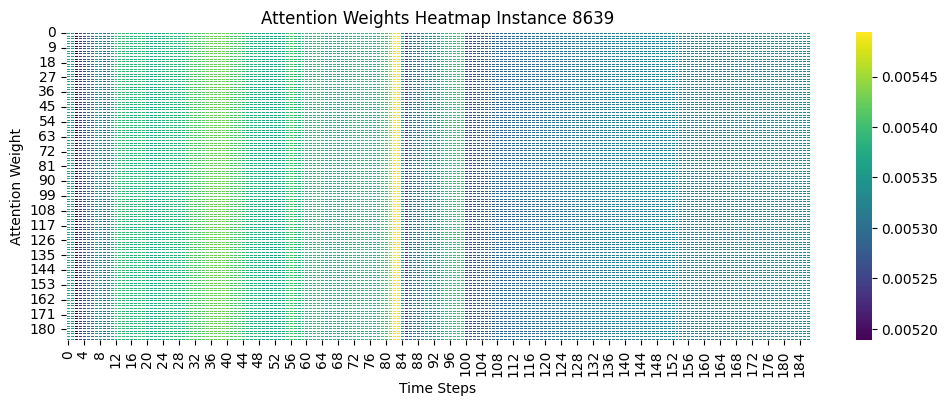

...

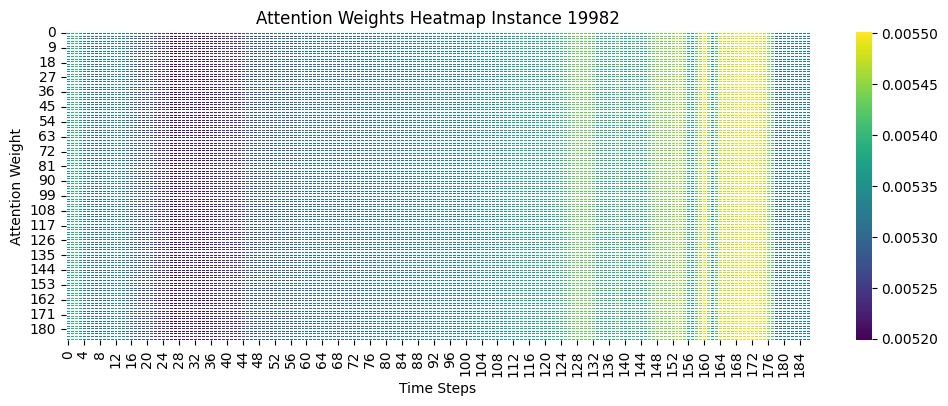

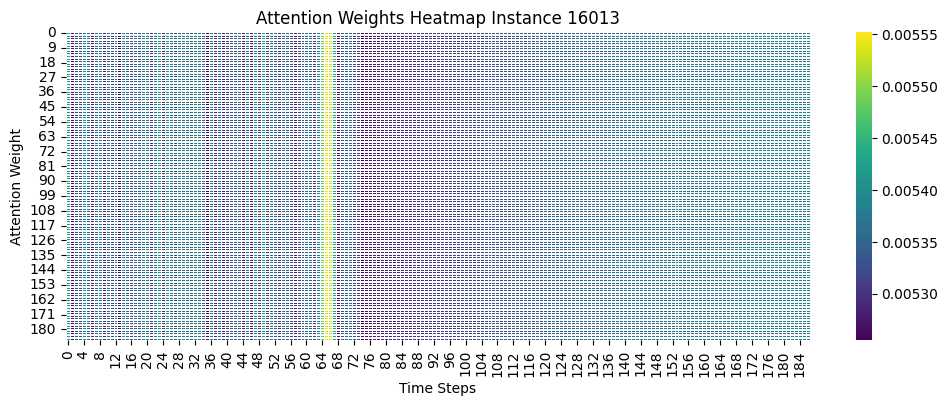

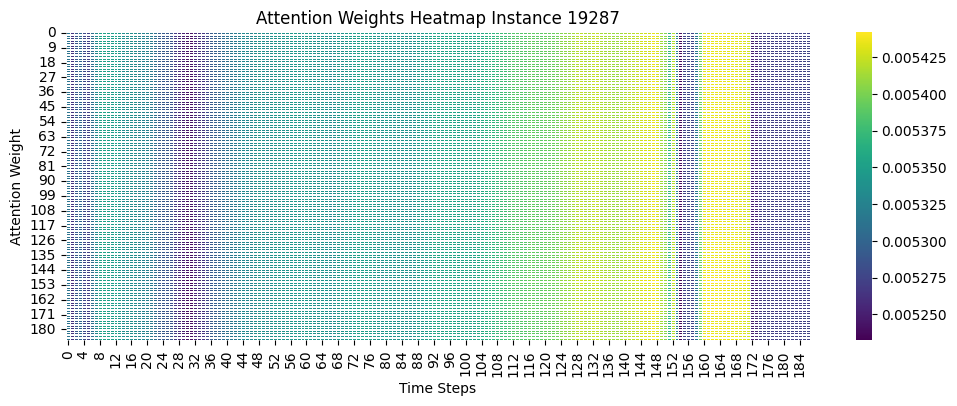

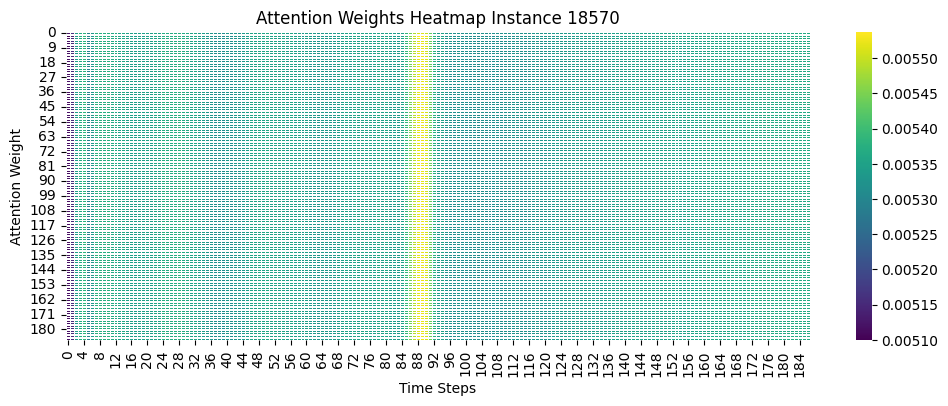

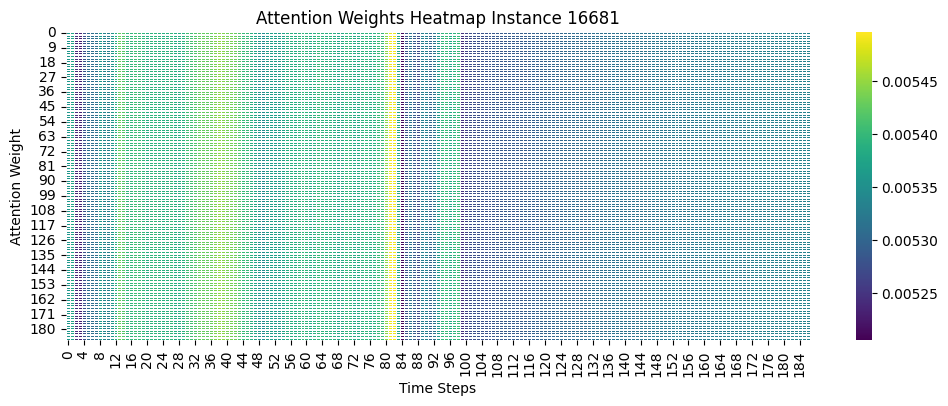

In [34]:
for sample_idx in incorrect_samples:
    sample_input = X_test_tensor[sample_idx].cpu().numpy()
    batch_weights = attention_maps[-1][sample_idx//batch_size]
    sample_attention = batch_weights[sample_idx%batch_size]

    # plot heatmap
    plt.figure(figsize=(12, 4))
    sns.heatmap(sample_attention, cmap="viridis", linewidths=0.5)
    plt.title(f"Attention Weights Heatmap Instance {sample_idx}")
    plt.xlabel("Time Steps")
    plt.ylabel("Attention Weight")

    plt.savefig(f"attention_weights_{sample_idx}")
    plt.show()

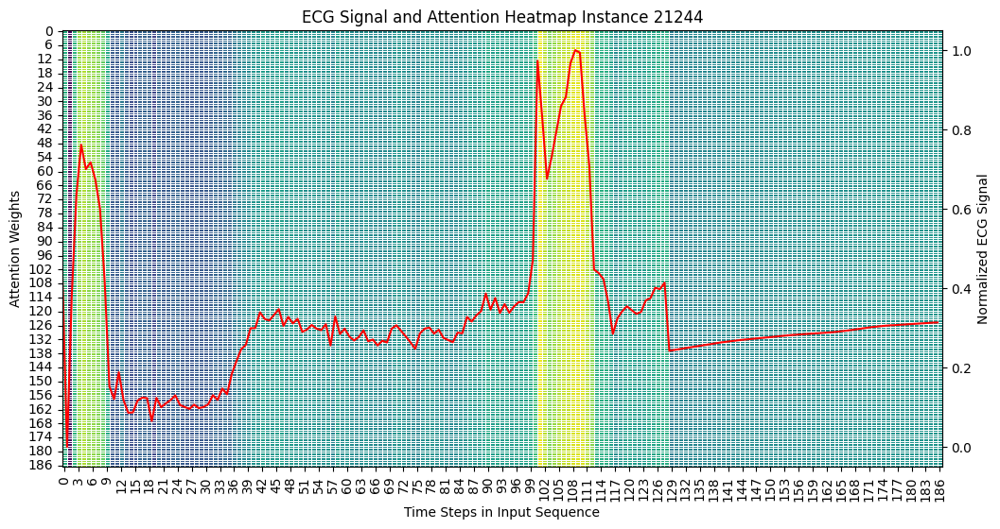

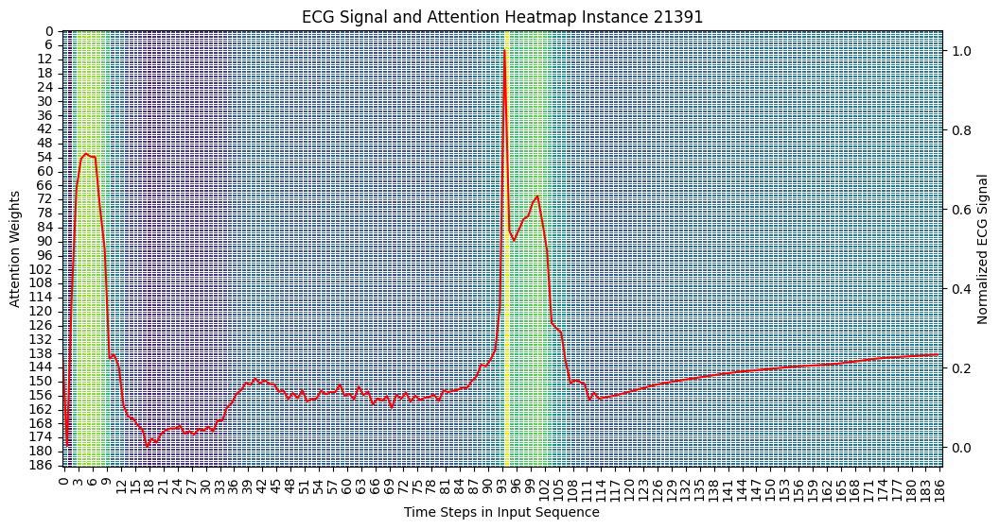

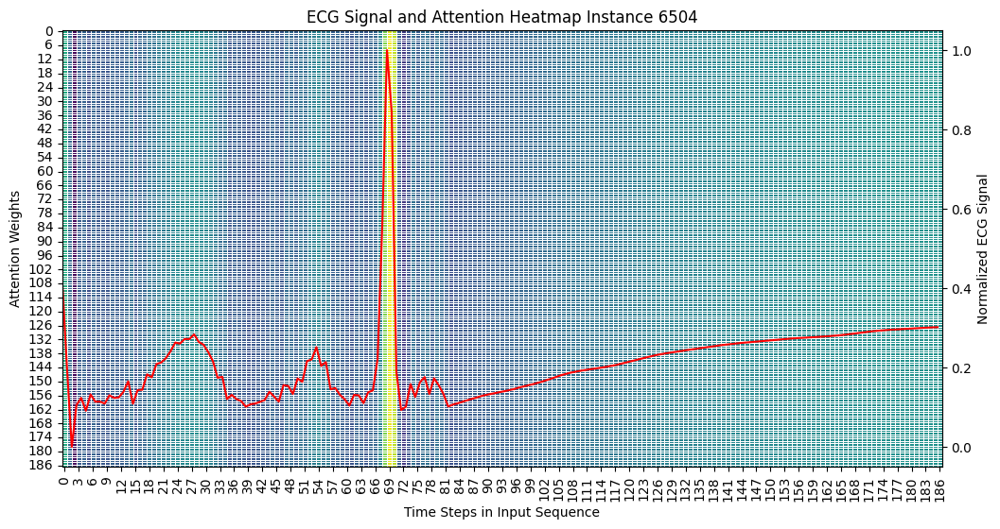

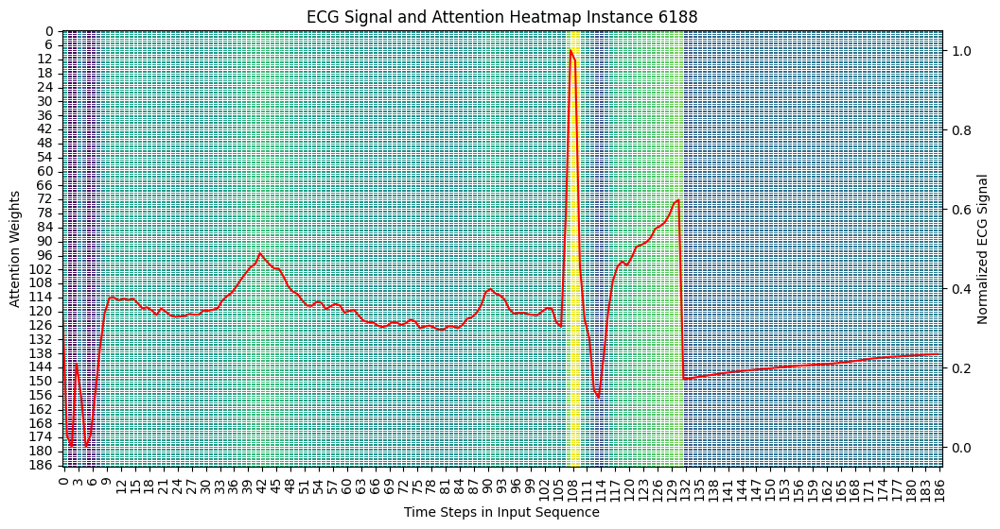

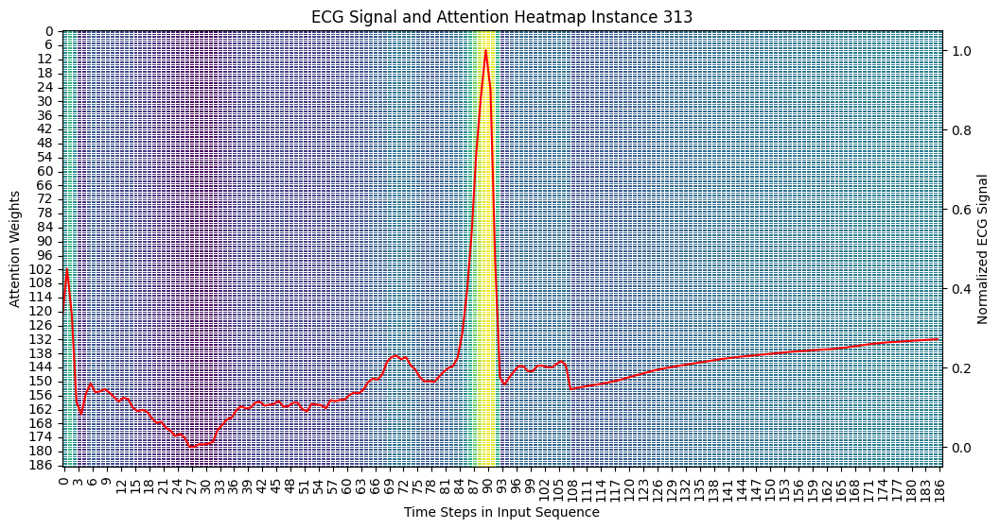

...

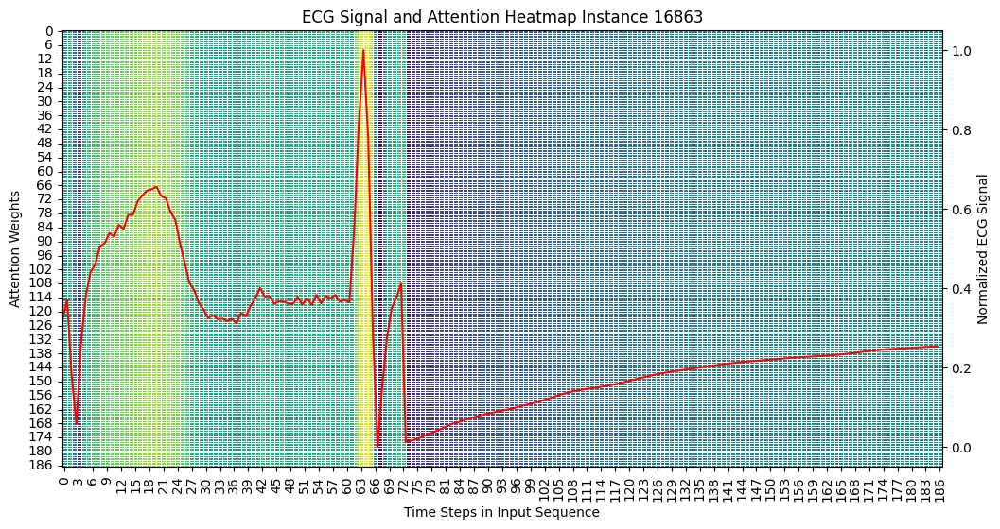

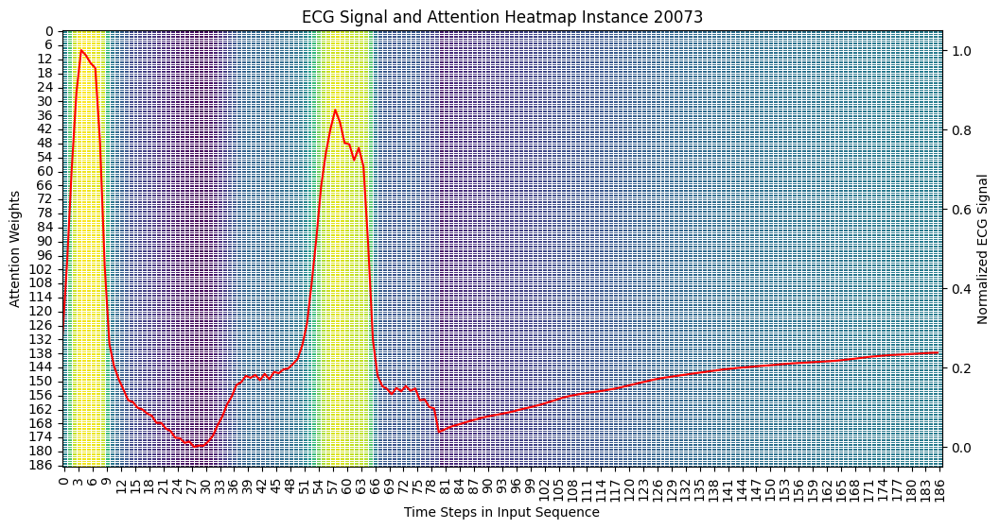

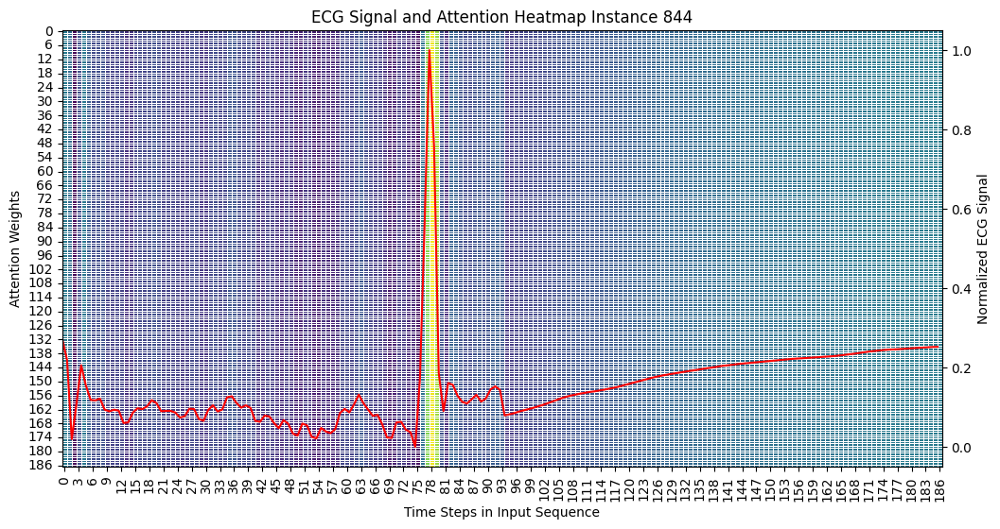

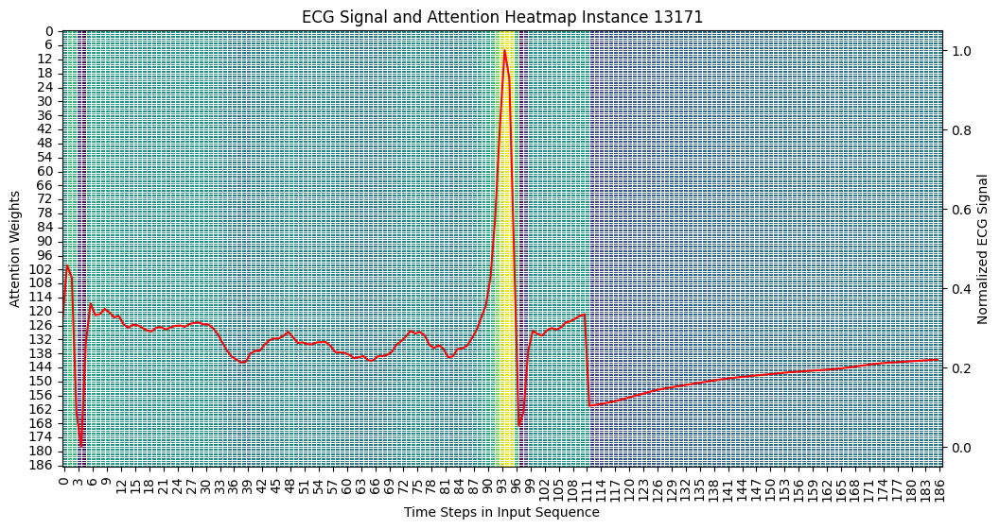

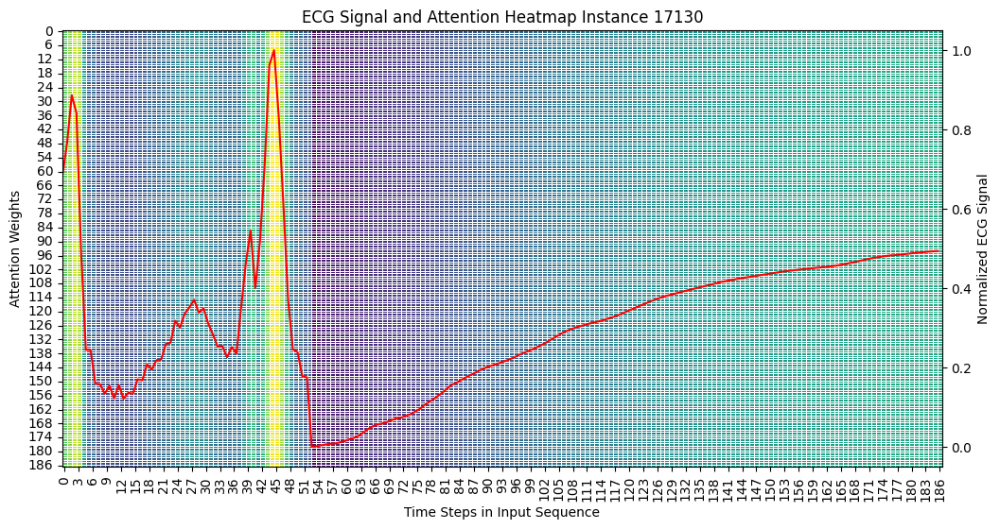

In [35]:
for sample_idx in correct_samples:
    sample_input = X_test_tensor[sample_idx].cpu().numpy()
    batch_weights = attention_maps[-1][sample_idx//batch_size]
    sample_attention = batch_weights[sample_idx%batch_size]

    # normalize ECG signal for visualization
    normalized_ecg_sample = (sample_input - sample_input.min()) / (sample_input.max() - sample_input.min())

    # create figure and axis
    fig, ax1 = plt.subplots(figsize=(12, 6))

    # plot heatmap
    sns.heatmap(sample_attention, cmap="viridis", linewidths=0.5, ax=ax1, cbar=False)
    ax1.set_xlabel("Time Steps in Input Sequence")
    ax1.set_ylabel("Attention Weights")
    ax1.set_title(f"ECG Signal and Attention Heatmap Instance {sample_idx}")

    # create a second y-axis for the ECG signal
    ax2 = ax1.twinx()
    ax2.plot(normalized_ecg_sample, color="r")
    ax2.set_ylabel("Normalized ECG Signal")

    plt.savefig(f"attention_weights_overlay_{sample_idx}")
    plt.show()

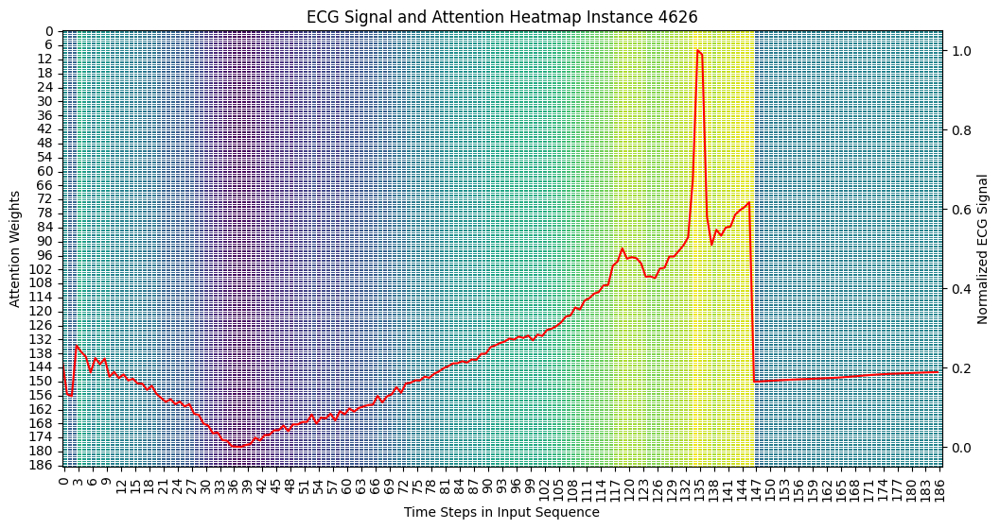

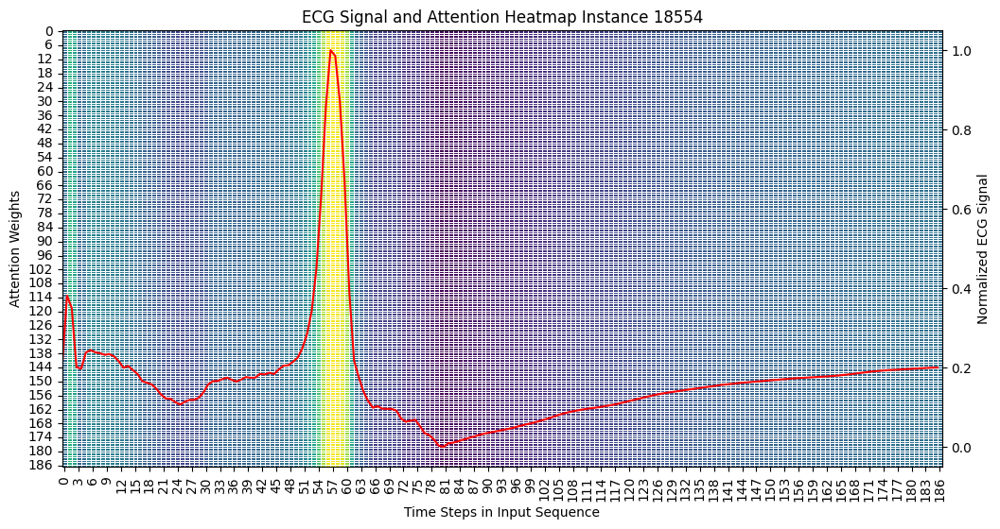

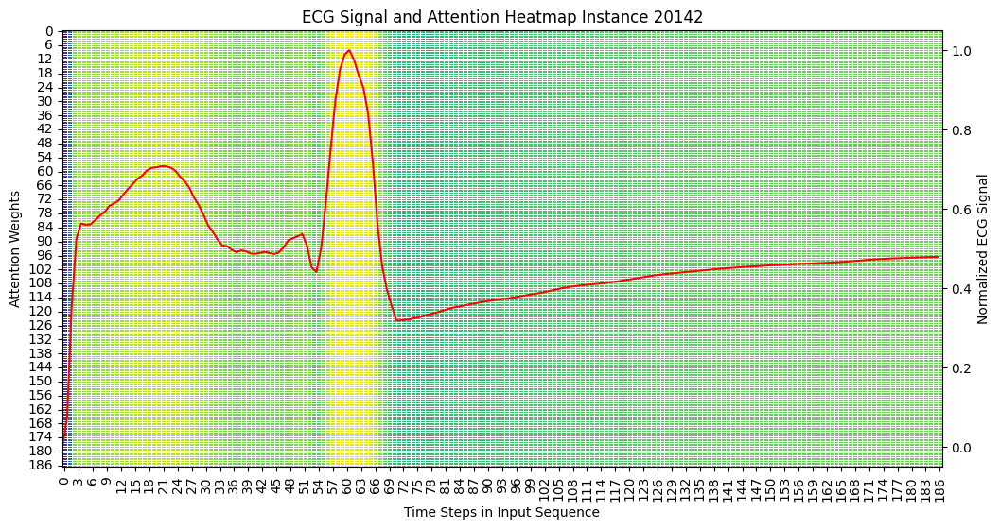

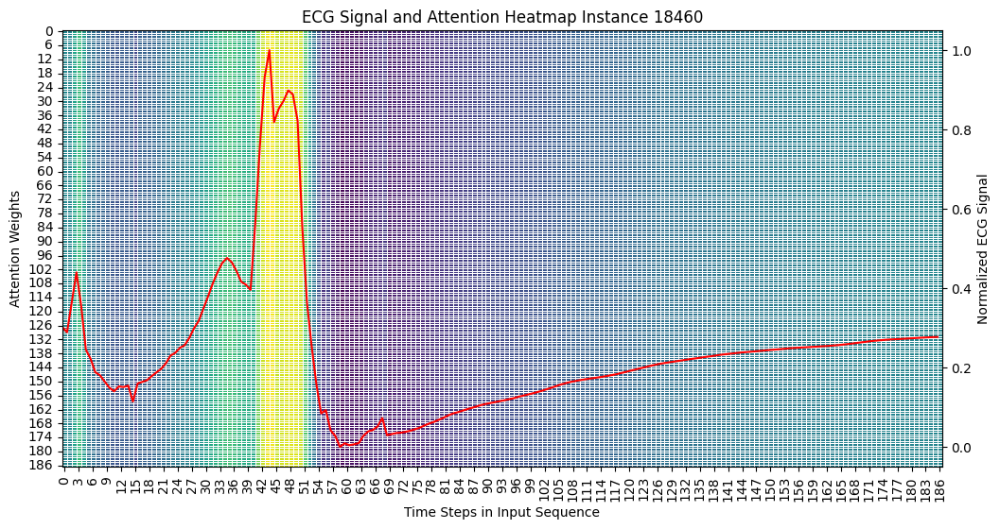

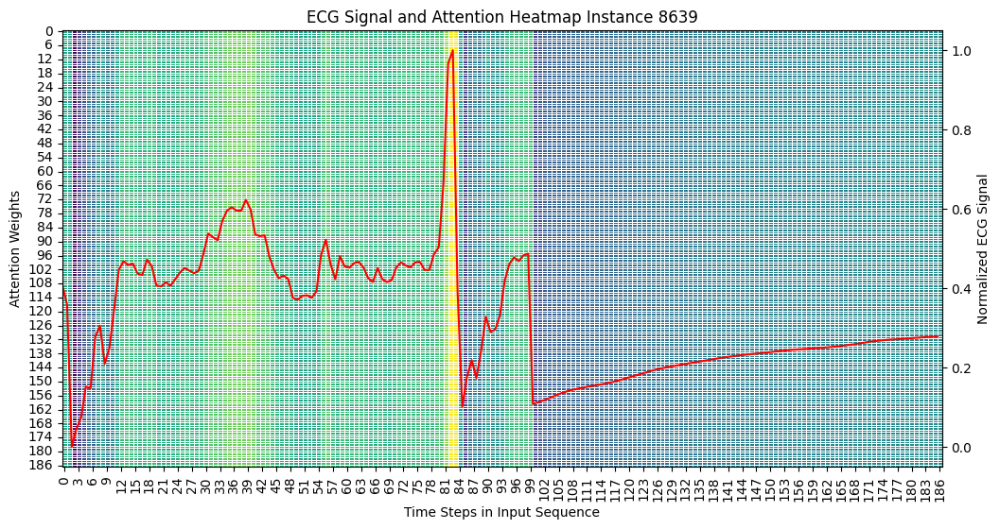

...

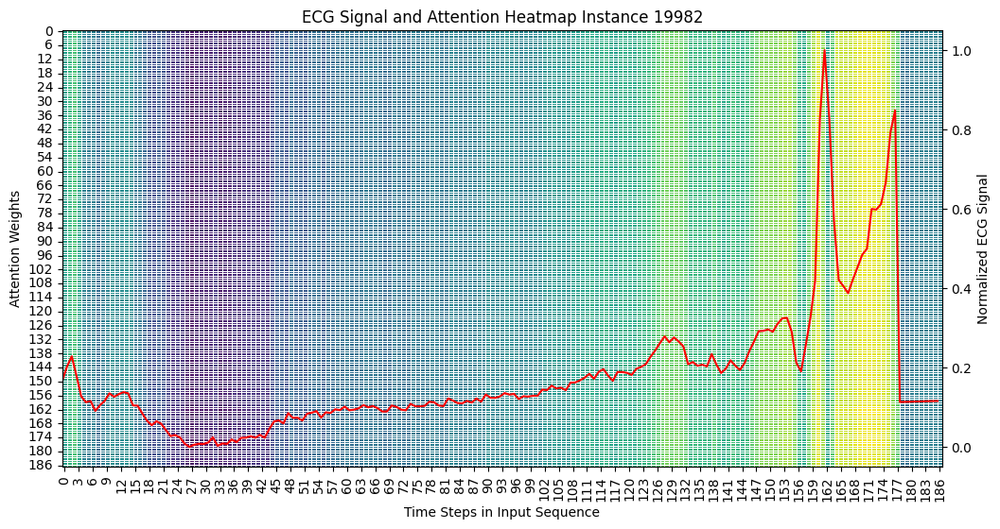

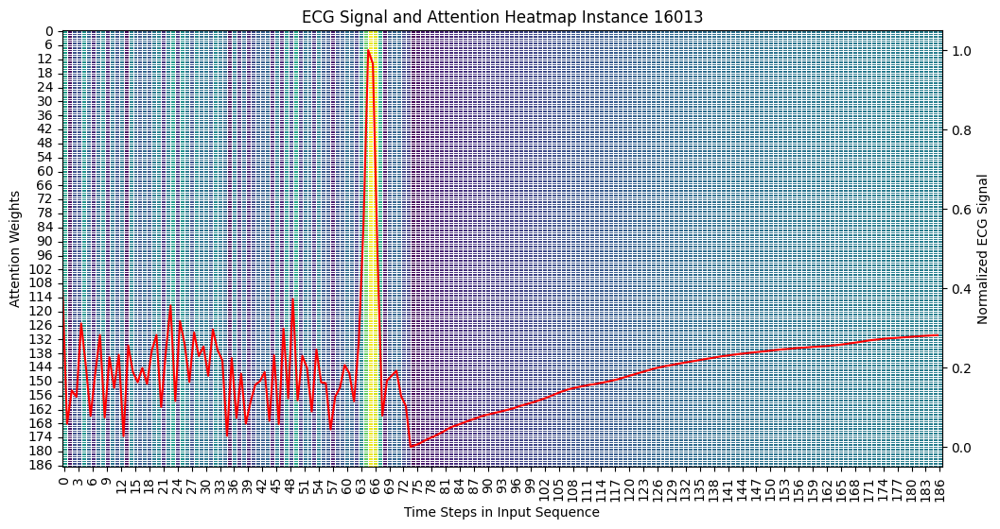

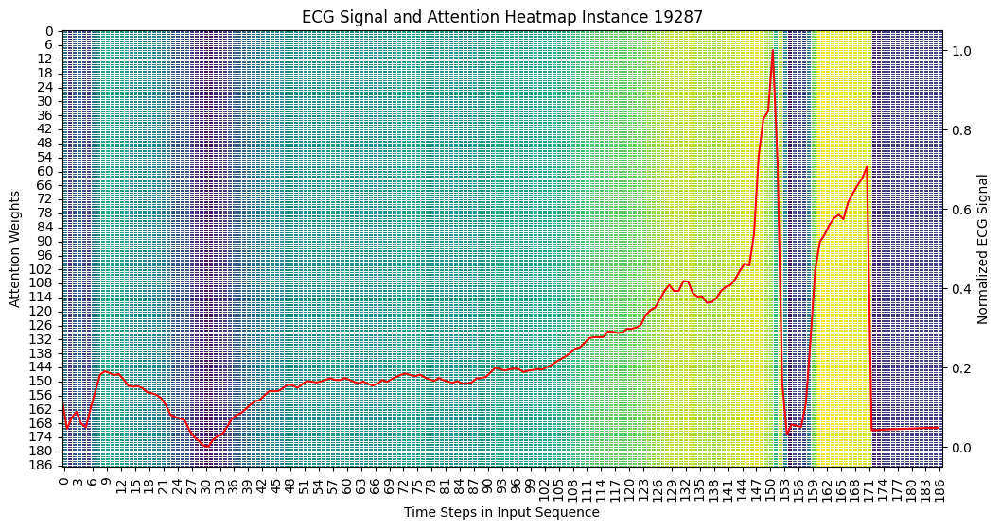

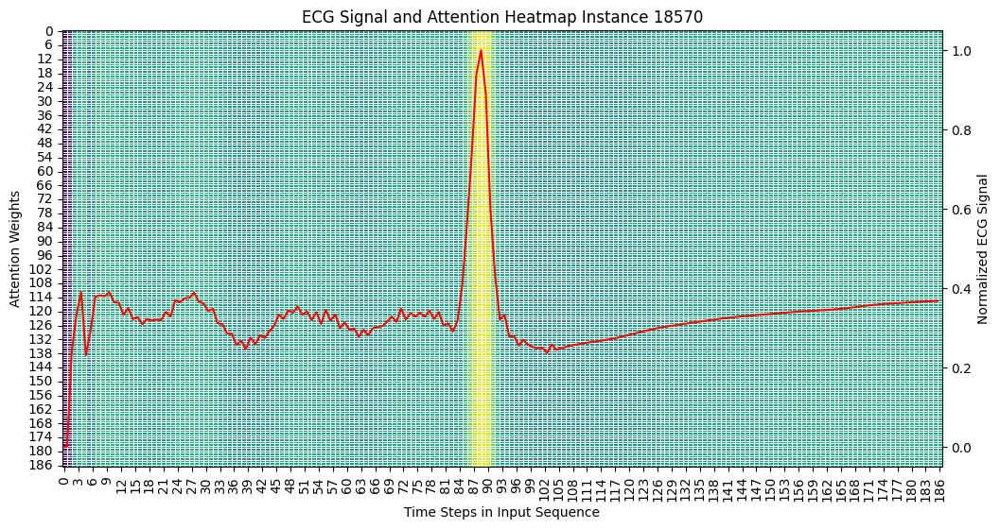

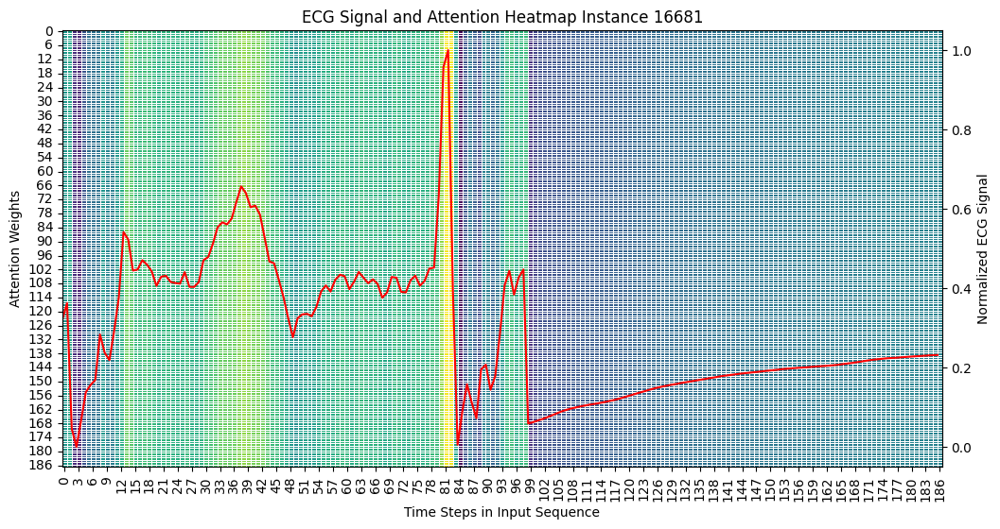

In [36]:
for sample_idx in incorrect_samples:
    sample_input = X_test_tensor[sample_idx].cpu().numpy()
    batch_weights = attention_maps[-1][sample_idx//batch_size]
    sample_attention = batch_weights[sample_idx%batch_size]

    # normalize ECG signal for visualization
    normalized_ecg_sample = (sample_input - sample_input.min()) / (sample_input.max() - sample_input.min())

    # create figure and axis
    fig, ax1 = plt.subplots(figsize=(12, 6))

    # plot heatmap
    sns.heatmap(sample_attention, cmap="viridis", linewidths=0.5, ax=ax1, cbar=False)
    ax1.set_xlabel("Time Steps in Input Sequence")
    ax1.set_ylabel("Attention Weights")
    ax1.set_title(f"ECG Signal and Attention Heatmap Instance {sample_idx}")

    # create a second y-axis for the ECG signal
    ax2 = ax1.twinx()
    ax2.plot(normalized_ecg_sample, color="r")
    ax2.set_ylabel("Normalized ECG Signal")

    plt.savefig(f"attention_weights_overlay_{sample_idx}")
    plt.show()

In [37]:
import os
import zipfile
from google.colab import files

exclude_dirs = {
    "/content/.config",
    "/content/tsc_attention",
    "/content/.config",
    "/content/.ipynb_checkpoints",
    "/content/sample_data",
}
exclude_files = {
    "heartbeat.zip",
    "kaggle.json",
    "mitbih_test.csv",
    "mitbih_train.csv",
    "ptbdb_abnormal.csv",
    "ptbdb_normal.csv",
    "tsc_lstmfcn.zip",
}

zip_filename = "/content/tsc_lstmfcn.zip"
with zipfile.ZipFile(zip_filename, "w") as zipf:
    for root, dirs, files_ in os.walk("/content"):
        dirs[:] = [d for d in dirs if os.path.join(root, d) not in exclude_dirs]

        for file in files_:
            if file not in exclude_files:
                print(file)
                file_path = os.path.join(root, file)
                zipf.write(file_path)

files.download(zip_filename)

saliency_overlay_lstmfcn_correct_16863.png
attention_weights_7136.png
attention_weights_overlay_18645.png
saliency_overlay_lstm_attention_correct_6504.png
saliency_overlay_lstm_attention_correct_796.png
saliency_overlay_lstm_attention_incorrect_6144.png
attention_weights_16568.png
attention_weights_overlay_15325.png
attention_weights_overlay_11136.png
lime_lstmfcn_attention_correct.html
saliency_overlay_lstm_attention_correct_21244.png
attention_weights_6026.png
saliency_overlay_lstm_attention_correct_573.png
saliency_overlay_lstm_attention_incorrect_16013.png
attention_weights_19663.png
attention_weights_20142.png
lime_lstmfcn_correct.html
attention_weights_overlay_19804.png
tsc_lstmfcn.pth
saliency_overlay_lstm_attention_correct_844.png
saliency_overlay_lstmfcn_incorrect_19287.png
saliency_overlay_lstm_attention_incorrect_20219.png
saliency_overlay_lstmfcn_correct_19948.png
saliency_overlay_lstmfcn_incorrect_20142.png
attention_weights_313.png
attention_weights_2842.png
attention_wei

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>